<a href="https://colab.research.google.com/github/J-Driesen/PD_goes_viral/blob/master/DPPD_goes_Viral.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Libraries**

In [ ]:
from sys import stdout 
# from google.colab import files

#data wrangling and maths:
import numpy as np
import pandas as pd

#for sanitizing RKI's data:
import re
import dateutil
import datetime as dt

#for smoothing growth factors:
from scipy.stats.mstats import gmean

#for modeling:
import sklearn
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
# from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# for clustering:
from sklearn.cluster import KMeans

#for scaling/PCA:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

#for Random Forest
from sklearn.ensemble import RandomForestRegressor

#for plotting:
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()
sns.set()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# **Data Preparation**



## Infection Data

Read in current RKI data directly from source:

In [ ]:
rki_raw = pd.read_csv('https://www.arcgis.com/sharing/rest/content/items/f10774f1c63e40168479a1feb6c7ca74/data')
rki_raw.tail()

,FID,IdBundesland,Bundesland,Landkreis,Altersgruppe,Geschlecht,AnzahlFall,AnzahlTodesfall,Meldedatum,IdLandkreis,Datenstand,NeuerFall,NeuerTodesfall,Refdatum,NeuGenesen,AnzahlGenesen,IstErkrankungsbeginn,Altersgruppe2
150227,12548158,16,Thüringen,LK Altenburger Land,A80+,M,1,0,2020/06/09 00:00:00,16077,"15.06.2020, 00:00 Uhr",0,-9,2020/05/19 00:00:00,0,1,1,Nicht übermittelt
150228,12548159,16,Thüringen,LK Altenburger Land,A80+,W,1,0,2020/05/06 00:00:00,16077,"15.06.2020, 00:00 Uhr",0,-9,2020/05/04 00:00:00,0,1,1,Nicht übermittelt
150229,12548160,16,Thüringen,LK Altenburger Land,A80+,W,1,0,2020/05/11 00:00:00,16077,"15.06.2020, 00:00 Uhr",0,-9,2020/05/01 00:00:00,0,1,1,Nicht übermittelt
150230,12548161,16,Thüringen,LK Altenburger Land,A80+,W,2,0,2020/05/28 00:00:00,16077,"15.06.2020, 00:00 Uhr",0,-9,2020/05/28 00:00:00,0,2,0,Nicht übermittelt
150231,12548162,16,Thüringen,LK Altenburger Land,A80+,W,1,0,2020/06/09 00:00:00,16077,"15.06.2020, 00:00 Uhr",0,-9,2020/06/09 00:00:00,-9,0,0,Nicht übermittelt


In [ ]:
# backed-up file (April 27th), in case server above is unavailable:
# rki_raw = pd.read_csv('https://raw.githubusercontent.com/J-Driesen/PD_goes_viral/master/rki_raw.csv')

### Infections()-class

Create Infections class to transform raw RKI data into one-row-one-day format, prepare performance measure and define utility functions:

In [ ]:
class Infections:
    
    def __init__(self, infection_reports=rki_raw, n_days_for_smoothing=7, threshold=5):
        self._raw = infection_reports
        self._raw['Landkreis_clean'] = self._raw['Landkreis'].map(Infections._clean_district_name)
        self._raw['date'] = pd.to_datetime(self._raw['Meldedatum'])
        self._earliest_date = self._raw['date'].min() #generating the date range from earliest to
        self._latest_date = self._raw['date'].max() #latest manually, instead of using np.unique, garantuees robustness against
        self._date_range = pd.date_range(self._earliest_date, self._latest_date) #missing days, even though rki_raw does not currently have those
        self._rki_districts = np.unique(self._raw['IdLandkreis']) #this does not contain 11000!
        self._all_districts = np.sort(np.append(self._rki_districts, 11000))
        self._only_inf_cases = self._raw[(self._raw.NeuerFall != -1)]# this removes rows containing corrections of previous data file version
        self._infections_by_date_and_district = None
        self._alpha_estimate_output = None
        self._dates_of_passed_threshold = None        
        self._n4s = n_days_for_smoothing
        self._thresh = threshold
        self._Germany_aggregate = None
        self._id2district = None
        self._start_date_mean_alpha = '1994-06-02' #out of bounds date as placeholder, to avoid type confusions      
        self._end_date_mean_alpha = '1994-06-02' #out of bounds date as placeholder, to avoid type confusions      
        self._start_date_inhib_coef = '1994-06-02' #out of bounds date as placeholder, to avoid type confusions      
        self._end_date_inhib_coef = '1994-06-02' #out of bounds date as placeholder, to avoid type confusions      
        
    @staticmethod
    def _clean_district_name(name):
        return re.sub('LK|SK|Stadt|Stadtkreis', '', name)
        
    def _build_id2district(self):
        ids = {}        
        for _, row in self._raw[['Landkreis_clean','IdLandkreis']].drop_duplicates().iterrows():        
            ids[row['IdLandkreis']] = row['Landkreis_clean']        
        ids[11000] = 'Berlin' #add aggregated Berlin, because structural data does not contain dis-aggregated subdistricts
        return ids
    
    def _calc_infections_by_date_and_district(self):    
        output_data = []
        for district in self._rki_districts:
            total_inf = 0
            for date in self._date_range:
                new_inf = self._only_inf_cases[(self._only_inf_cases.date == date) & 
                                               (self._only_inf_cases.IdLandkreis == district)].AnzahlFall.sum()
                total_inf += new_inf
                output_data.append(
                    {'districtId' : district,
                     'date' : date.strftime('%Y-%m-%d'),
                     'new_infected' : new_inf,
                     'total_infected' : total_inf}
                )

        #rki_raw Berlin is separated into sub-districts, structure data has only aggregate, so we calculate aggregate
        total_inf = 0 #reset infection integrator
        for date in self._date_range.strftime('%Y-%m-%d'):
                new_inf = self._only_inf_cases[(self._only_inf_cases.date == date) & 
                                               (self._only_inf_cases.IdLandkreis > 11000) & #Berlin = 11\d\d\d
                                               (self._only_inf_cases.IdLandkreis < 12000)].AnzahlFall.sum()
                total_inf += new_inf
                output_data.append(
                    {'districtId' : 11000,
                     'date' : date,
                     'new_infected' : new_inf,
                     'total_infected' : total_inf}
                )        

        output_df = pd.DataFrame(data = output_data)
        output_df = output_df.sort_values(['districtId','date']).reset_index(drop = True)        
        return output_df

    def _calc_alpha_estimates(self):
        n_days_4_smoothing = self._n4s
        threshold = self._thresh
        output_df = pd.DataFrame()
        dates_df = pd.DataFrame()
        for district in self._all_districts:
            output_per_district = []
            district_data = self.infections_by_date_and_district[self.infections_by_date_and_district.districtId == district]
            n_row = district_data.shape[0]
            thresh_passed = False
            smoothed_new = np.NaN
            alpha_t = np.NaN
            threshold_date = np.NaN                    
            smoothed_new_day_before = np.NaN
            for row in range(n_row):
                if not thresh_passed and district_data.new_infected.iloc[row] >= threshold:
                    thresh_passed = True #saves info that threshold was passed
                    threshold_date = district_data.date.iloc[row]
                if not thresh_passed:
                    continue #next row, no writing into output, when threshold not passed this row at the latest
                if row >= (n_days_4_smoothing - 1): #first e.g. six days stay initialized NaN when 7-day-smoothing
                    smoothing_rows = range(row - n_days_4_smoothing + 1,
                                           row + 1)
                    smoothed_new = district_data.new_infected.iloc[smoothing_rows].mean()
                    if smoothed_new_day_before != 0:
                        alpha_t = smoothed_new / smoothed_new_day_before
                    else:
                        alpha_t = np.NaN
                    smoothed_new_day_before = smoothed_new
                output_per_district.append(
                    {'districtId' : district,
                     'date' : district_data.date.iloc[row],
                     'smoothed_new' : smoothed_new,
                     'alpha_t' : alpha_t}
                )
            output_df = output_df.append(pd.DataFrame(data = output_per_district[1:])) #drop first row due to alpha_t = NaN
            dates_df = dates_df.append(pd.DataFrame(data = {'districtId' : [district],
                                                            'threshold_date' : [threshold_date]}))
            
        output_df.alpha_t.fillna(0, inplace=True)
        #if more than one week without infections, div by zero causes NaNs, which are replaced with zeros here

        return [output_df.reset_index(drop = True),
                dates_df.reset_index(drop = True)] #reset index, because it was restarting for each district

    def _calc_Germany_aggregate(self): 
        #kick the Berlin aggregate as its infection numbers are also in sub-districts
        input_data = self.infections_by_date_and_district[self.infections_by_date_and_district.districtId != 11000]
        output_data = [] #initialise empty output data        
        for date_ in self._date_range.strftime('%Y-%m-%d'):
            day_data = input_data[input_data.date == date_]
            new_inf = day_data.new_infected.sum()
            total_inf = day_data.total_infected.sum()
            output_data.append(
                {'date' : date_,
                 'new_infected' : new_inf,
                 'total_infected' : total_inf}
            )
        output_df = pd.DataFrame(data = output_data)
        return output_df

    
    def inhib_coef_date_range(self, first_date, last_date):

        """Function to calculate the rate of change of smoothed growth factors between first and last date.        
        Takes as input first and last date, and the dataframe containing dates, districtIds and the smoothed growth factors, i.e. the 0th output of the function defined above, smoothed_growth_and_inhibition(). The name for this dataframe that is assigned above is set as default here.
        First and last date have to be entered in YYYY-MM-DD format. Errors are raised when format is violated. This catches e.g. June 17th as 2020-17-06, but it obviously cannot save you from mixing up e.g. June 5th and May 6th, so beware!
        Dates are also checked to be in the data at all, with specific errors for first and last dates out of bounds. Function also prints number of individual districts that are out of bounds for a given pair of dates.
        Output is a dataframe containing districtIds and partial inhibition coefficients.
        Districts where dates were out of bounds are dropped from output.
        """
        
        if not re.match('^202\d-(0[1-9]|1[012])-(0[1-9]|[12][0-9]|3[01])$', first_date):
          print('First date format invalid. Correct format: YYYY-MM-DD')
          return
        if not re.match('^202\d-(0[1-9]|1[012])-(0[1-9]|[12][0-9]|3[01])$', last_date):
          print('Last date format invalid. Correct format: YYYY-MM-DD')
          return
        if not any(first_date == self.alpha_estimates.date):
          print("First date out of bounds!")
          return
        if not any(last_date == self.alpha_estimates.date):
          print("Last date out of bounds!")
          return

        self._start_date_inhib_coef = first_date
        self._end_date_inhib_coef = last_date

        output_df = pd.DataFrame() #initialise output df
        count_out_of_bounds = 0 #initialise counter for districts with no data for the date range
        count_alpha_gaps = 0 #initialise counter for districts with NaNs in their alpha esitmates during date range

        for dist in self._all_districts:
          district_data = self.alpha_estimates[self.alpha_estimates.districtId == dist].copy()

          if not set((first_date, last_date)).issubset(district_data.date):
            count_out_of_bounds += 1
            continue          
          
          index_first_date = district_data.index[district_data.date == first_date][0]
          index_last_date = district_data.index[district_data.date == last_date][0]
          index_range = range(index_first_date, index_last_date + 1)
          cut_dist_data = district_data[district_data.index.isin(index_range)]

          # if any(cut_dist_data.alpha_t.isna()):
          #   # cut_dist_data.alpha_t.fillna(0, inplace=True)
          #   count_alpha_gaps += 1
          #   continue

          y = cut_dist_data['alpha_t']          
          X = np.array(range(len(y))).reshape((-1,1))                      
          regr = linear_model.LinearRegression()                      
          regr.fit(X, y)
        
          output_df = output_df.append({'districtId' : dist,
                                      'partial_inhib_coef' : regr.coef_[0]},
                                      ignore_index=True)
        
        output_df['districtId'] = output_df.districtId.astype('int64')
        stdout.write("\n- CALCULATING INHIBITION COEFFICIENTS -\nDistricts out of bounds: " + 
                     str(count_out_of_bounds))# + "\nDistricts with gaps in alpha estimates: " + str(count_alpha_gaps)) 

        return(output_df)

    def geom_mean_date_range(self, first_date, last_date):
        
        """Function to calculate the geometric mean of smoothed growth factors between first and last date.        
        Geometric mean was chosen so that number of infected after e.g. ten days of mean growth of 1.2 is in fact 1.2^10 times as high as number of infected at the start.
        Takes as input first and last date, and the dataframe containing dates, districtIds and alpha estimates
        First and last date have to be entered in YYYY-MM-DD format. Errors are raised when format is violated. This catches e.g. June 17th as 2020-17-06, but it obviously cannot save you from mixing up e.g. June 5th and May 6th, so beware!
        Dates are also checked to be in the data at all, with specific errors for first and last dates out of bounds. Function also prints number of individual districts that are out of bounds for the given pair of dates.
        Output is a dataframe containing districtIds and mean growth factors. Districts where dates were out of bounds are dropped from output."""
        
        if not re.match('^202\d-(0[1-9]|1[012])-(0[1-9]|[12][0-9]|3[01])$', first_date):
          print('First date format invalid. Correct format: YYYY-MM-DD')
          return
        if not re.match('^202\d-(0[1-9]|1[012])-(0[1-9]|[12][0-9]|3[01])$', last_date):
          print('Last date format invalid. Correct format: YYYY-MM-DD')
          return
        if not any(first_date == self.alpha_estimates.date):
          print("First date out of bounds!")
          return
        if not any(last_date == self.alpha_estimates.date):
          print("Last date out of bounds!")
          return
        
        self._start_date_mean_alpha = first_date
        self._end_date_mean_alpha = last_date

        output_df = pd.DataFrame()
        count_out_of_bounds = 0
        count_alpha_gaps = 0

        for district in self._all_districts:
          district_data = self.alpha_estimates[self.alpha_estimates.districtId == district].copy()

          if not set((first_date, last_date)).issubset(district_data.date):
            count_out_of_bounds += 1
            continue
                    
          index_first_date = district_data.index[district_data.date == first_date][0]
          index_last_date = district_data.index[district_data.date == last_date][0]
          index_range = range(index_first_date, index_last_date + 1)
          cut_dist_data = district_data[district_data.index.isin(index_range)]

          # if any(cut_dist_data.alpha_t.isna()):
          #   # cut_dist_data.alpha_t.fillna(0, inplace=True)
          #   count_alpha_gaps += 1
          #   continue

          mean_growth_factor = gmean(cut_dist_data['alpha_t'])          
          output_df = output_df.append({'districtId' : district,
                                      'mean_alpha' : mean_growth_factor},
                                      ignore_index=True)
          
        output_df['districtId'] = output_df.districtId.astype('int64')        
        stdout.write("\n- CALCULATING MEAN ALPHAS -\nDistricts out of bounds: " + str(count_out_of_bounds))# +
                    #  "\nDistricts with gaps in alpha estimates: " + str(count_alpha_gaps)) 
        
        return(output_df)

    def plot_district(self,districtId):

        """this function plots the cumulative sum of the smoothed newly infected and the alpha_t estimates for a given district. The sum corresponds to the total infected column in the infected_per_day_and_district object, but is less noisy. 
        The y-range for the alpha estimates is fixed to (0, 4), with extreme values at the top thus cut-off. 
        Dates on x-axis span entire time since district passed threshold, and thus vary from district to district. For easier comparison, this function will show the windows for which mean alphas and/or inhibition coefficients have been calculated IN THE SAME CLASS-INSTANCE. This means that these are only marked once the corresponding functions have been called from the same instance. Mean alpha date ranges are red, inhibition coefficient ranges blue. Since they might coincide, the end of the mean range and the start of the IC range are dashed more sparse so they fill each other's gaps.  """

        district_data = self.alpha_estimates[self.alpha_estimates.districtId==districtId].copy()
        x= pd.to_datetime(district_data.date)
        y1 = district_data.smoothed_new.cumsum()
        y2 = district_data.alpha_t

        fig, ax1 = plt.subplots()

        color1 = 'k'
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Smoothed Cumulated Infections', color = color1)
        ax1.plot(x,y1, color = color1)
        ax1.tick_params(axis='y', color=color1)
        plt.xticks(rotation=30)
        ax1.set_xlim(x.min(),x.max())
        ax1.set_title(self.id2district.get(districtId))

        ax1.axvline(pd.to_datetime(self._start_date_mean_alpha), color='r', linestyle='--', lw=2)#start mean alpha
        ax1.axvline(pd.to_datetime(self._end_date_mean_alpha), color='r', linestyle=(0, (2,4)), lw=2)#end mean alpha 
        ax1.axvline(pd.to_datetime(self._start_date_inhib_coef), color='b', linestyle=(3, (2,4)), lw=2)#start IC
        ax1.axvline(pd.to_datetime(self._end_date_inhib_coef), color='b', linestyle='--', lw=2)#end IC

        ax2 = ax1.twinx()
        color2 = 'tab:orange'
        ax2.set_ylabel('Alpha estimate', color = color2)
        ax2.plot(x, y2, color = color2, alpha = .5)
        ax2.tick_params(axis='y', labelcolor = color2)
        ax2.set_ylim((-.05,4))
        ax2.grid(None)

        fig.tight_layout()
        plt.show()

          
    @property
    def id2district(self):
        if self._id2district is None:
            self._id2district = self._build_id2district()
        return self._id2district
    
    @property #this property saves one from calculating infections by date and district at every call
    def infections_by_date_and_district(self):
        if self._infections_by_date_and_district is None:
            self._infections_by_date_and_district = self._calc_infections_by_date_and_district()
        return self._infections_by_date_and_district

    @property #this property saves one from calculating alpha estimates at every call
    def alpha_estimates(self):
        if self._alpha_estimate_output is None:
            self._alpha_estimate_output = self._calc_alpha_estimates()
        return self._alpha_estimate_output[0]

    @property
    def threshold_dates(self):
        if self._alpha_estimate_output is None:
            self._alpha_estimate_output = self._calc_alpha_estimates()
        return self._alpha_estimate_output[1]

    @property
    def Germany_aggregate(self):
        if self._Germany_aggregate is None:
            self._Germany_aggregate = self._calc_Germany_aggregate()
        return self._Germany_aggregate
            

This python class is currently the power-house of our prototype, and also our most likely candidate for a product that is transferable to other countries.

### Applying the class-functions

Create class instance:

In [ ]:
infections_ = Infections()

This class instance can know plot the course of infection in a given district, shown here for the Main-Taunus-Kreis:

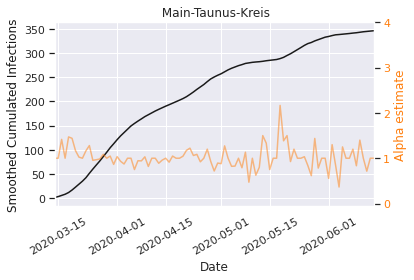

In [ ]:
infections_.plot_district(6436)

Calculate inhibition coefficient for the first two weeks of april. Around this time, the curve of cumulative cases in Germany showed an inflection point, so it there seems to have been a lot of 'curve-flattening' showing effects.

In [ ]:
inhibition_coefs = infections_.inhib_coef_date_range(first_date = '2020-04-01', last_date = '2020-04-14')


- CALCULATING INHIBITION COEFFICIENTS -
Districts out of bounds: 25

To control for the fact that performing worse at time 1 entails more room for improvement at time 2, the mean growth factor in the week before the above range is calculated as a control variable:

In [ ]:
mean_growth_factors = infections_.geom_mean_date_range(first_date = '2020-03-25', last_date = '2020-03-31')


- CALCULATING MEAN ALPHAS -
Districts out of bounds: 48

For the hackathon, we'll also need a maximum alpha per district, created below:

In [ ]:
alphas = infections_.alpha_estimates
max_alpha = alphas.groupby('districtId')['alpha_t'].max()
PR90_ = alphas.groupby('districtId')['alpha_t'].quantile(.9)
PR95_ = alphas.groupby('districtId')['alpha_t'].quantile(.95)

districtId
1002     False
1003     False
1004     False
1051     False
1053     False
         ...  
16073    False
16074    False
16075    False
16076    False
16077    False
Name: alpha_t, Length: 404, dtype: bool

using the max leads to the following terrible target distribution:


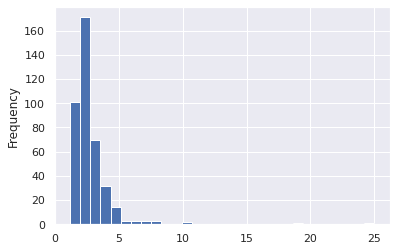

so switching to 90th/95th percentile makes more sense, I would say.
95th would look like this:


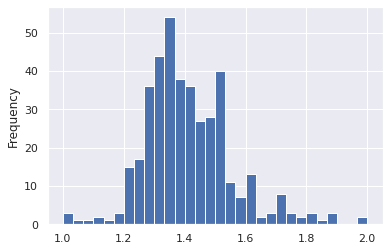

90th like this:


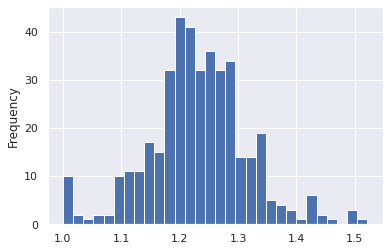

In [ ]:
print('using the max leads to the following terrible target distribution:')
max_alpha.plot.hist(bins=30)
plt.show()
print('so switching to 90th/95th percentile makes more sense, I would say.\n95th would look like this:')
PR95_.plot.hist(bins=30)
plt.show()
print('90th like this:')
PR90_.plot.hist(bins=30)
plt.show()

The Infections-class also generates a dictionary for linking district IDs to district names:

In [ ]:
# infections_.id2district

## Structural Data


Read in structure data from JD's GitHub:


In [ ]:
structuredata_raw = pd.read_csv('https://raw.githubusercontent.com/J-Driesen/PD_goes_viral/master/landatlas_sanitized_v006.csv')

Create categorical column: Neues Bundesland ja/nein. Berlin treated separately.

In [ ]:
Bundesland_Neu_oder_Alt = []

for i in structuredata_raw.index:
  did = str(structuredata_raw.districtId[i]) #district ID
  NeuesBL = re.match("1[23456]\d\d\d", did) #Neue Bundesländer 12xxx, 13xxx, 14xxx, 15xxx, 16xxx
  Berlin = re.match("11\d\d\d", did) #Berlin 11xxx
  
  if NeuesBL:
    Bundesland_Neu_oder_Alt.append("Neues Bundesland")
  elif Berlin:
    Bundesland_Neu_oder_Alt.append("Berlin")
  else:
    Bundesland_Neu_oder_Alt.append("Altes Bundesland")

structuredata_raw['Bundesland_Neu_oder_Alt'] = Bundesland_Neu_oder_Alt

Create sparse dataframe:
(Note the lower count for Baulandpreise)

In [ ]:
structuredata_sparse =  structuredata_raw.replace(-99, np.nan)
structuredata_sparse.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401 entries, 0 to 400
Data columns (total 51 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   districtId                      401 non-null    int64  
 1   district_name                   401 non-null    object 
 2   Schulabg_ohne_Abschluss         401 non-null    float64
 3   Schulabg_Hochschulreife         401 non-null    float64
 4   Wohnungsleerstand               401 non-null    float64
 5   ALQ_gemittelt                   401 non-null    float64
 6   Bev_Potenzial                   401 non-null    float64
 7   Einkommen                       401 non-null    float64
 8   Distanz_grosse_Zentren          401 non-null    float64
 9   Lebenserwartung_Maenner         401 non-null    float64
 10  Lebenserwartung_Frauen          401 non-null    float64
 11  Lohn                            401 non-null    float64
 12  Landw_Forstw_Anteil             401 

Since only Baulandpreise has missing values, and its utility is probably low, it is dropped from the further analysis:

In [ ]:
structuredata_dense = structuredata_sparse.dropna(axis = 1)

### Ruralness and Socioeconomic Status Indices

(Re-)Create Ruralness- and Socioeconomic-Status-Index, adapted from BMEL Landatlas studies, modified to generate values for all 401 districts in structural data:

In [ ]:
Ruralness_vars = ['Siedlungsdichte', 'Landw_Forstw_Anteil', 'Ein_Zwei_Fam_Haeuser',
                  'Bev_Potenzial', 'Distanz_grosse_Zentren']

Socioecon_vars = ['ALQ_gemittelt', 'Lohn', 'Einkommen', 'Steuerkraft', 
                 'Bev_Wanderung', 'Wohnungsleerstand', 'Lebenserwartung_Maenner', 
                 'Lebenserwartung_Frauen', 'Schulabg_ohne_Abschluss']

Ruralness consists of settlement density, area percentage of farming and forest areas, residence percentage of 1- and 2-family houses, surrounding population densities weighted by distance, and distance to the next five urban centers.

Socioeconomic Status consists of unemplyment rate, mean salaries, mean income, communal tax revenue, net population migration, residence vacancies, life expectancy for men and women, and percentage of high-school drop-outs.

In [ ]:
scaler = StandardScaler()

#First, create Ruralness Index:
df_unscaled_Ruralness = structuredata_dense[Ruralness_vars]
df_scaled_Ruralness = pd.DataFrame(scaler.fit_transform(df_unscaled_Ruralness), columns = Ruralness_vars)

pca_ = PCA(1, random_state = 1)
pca_.fit(df_scaled_Ruralness)
variance_explained_Ruralness = pca_.explained_variance_ratio_
print("Ruralness Index captures %4.1f %% of the variance in its %d constituents." % 
      ((variance_explained_Ruralness * 100), len(Ruralness_vars)))

#this next part checks whether loadings are all in the right direction
loading_signs_found_Ruralness = np.sign(pca_.components_)
loading_signs_ought_Ruralness = [-1,1,1,-1,1]

if (loading_signs_found_Ruralness == loading_signs_ought_Ruralness).all():
  structuredata_dense['Ruralness_Index'] = pca_.transform(df_scaled_Ruralness)
elif (- loading_signs_found_Ruralness == loading_signs_ought_Ruralness).all(): 
  #if they are simply reversed, i.e. doing a urbanness index, they are re-reversed here:
  structuredata_dense['Ruralness_Index'] = - pca_.transform(df_scaled_Ruralness)
else:
  raise ValueError('Ruralness-loadings were not as expected! Reversing their signs did not help!')

#Next, the same for the Socioeconomic status:
df_unscaled_Socioecon = structuredata_dense[Socioecon_vars]
df_scaled_Socioecon = pd.DataFrame(scaler.fit_transform(df_unscaled_Socioecon), columns = Socioecon_vars)

pca_.fit(df_scaled_Socioecon)
variance_explained_Socioecon = pca_.explained_variance_ratio_
print("Socioeconomic Index captures %4.1f %% of the variance in its %d constituents." % 
      ((variance_explained_Socioecon * 100), len(Socioecon_vars)))

loading_signs_found_Socioecon = np.sign(pca_.components_) #same direction check as above
loading_signs_ought_Socioecon = [-1,1,1,1,1,-1,1,1,-1]

if (loading_signs_found_Socioecon == loading_signs_ought_Socioecon).all():
  structuredata_dense['Socioecon_Index'] = pca_.transform(df_scaled_Socioecon)
elif (- loading_signs_found_Socioecon == loading_signs_ought_Socioecon).all():
  structuredata_dense['Socioecon_Index'] = - pca_.transform(df_scaled_Socioecon)
else:
  raise ValueError('Socioecon-loadings were not as expected! Reversing their signs did not help!')


Ruralness Index captures 75.7 % of the variance in its 5 constituents.
Socioeconomic Index captures 54.2 % of the variance in its 9 constituents.


### Clustering

Cluster districts according to the two indices just created. Identifying the optimal number of clusters using the so-called elbow-method:

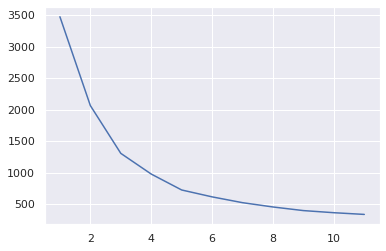

In [ ]:
clust_df = structuredata_dense[['Socioecon_Index', 'Ruralness_Index']].copy()
max_k=12
wcss=[]

for k in range(1,max_k):
  kmeans = KMeans(k)
  kmeans.fit(clust_df)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_of_clusters = range(1,max_k)
plt.plot(number_of_clusters,wcss)

This looks like a 5-cluster solution to me...

In [ ]:
# for k in range(3,8):
#   kmeans = KMeans(k)
#   identified_clusters = kmeans.fit_predict(clust_df)
#   print('        A ' + str(k) +'-cluster solution would look like this:')
#   plt.scatter(clust_df['Ruralness_Index'],clust_df['Socioecon_Index'],
#               c=identified_clusters,cmap='rainbow')
#   plt.xlabel('Ruralness')
#   plt.ylabel('Socioeconomic Status')
#   plt.show()

I will stick with the 5-cluster solution for the rest of this analysis

In [ ]:
kmeans = KMeans(5, random_state=123) 
#random state makes sure that cluster labels stay the same between executions
structuredata_dense['cluster'] = kmeans.fit_predict(clust_df)

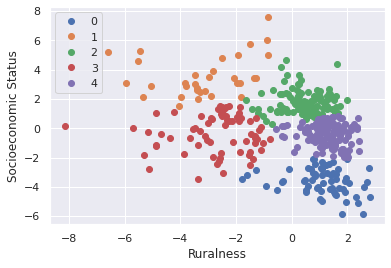

In [ ]:
groups = structuredata_dense.groupby("cluster")
for name, group in groups:
  plt.plot(group['Ruralness_Index'], group['Socioecon_Index'], marker="o", linestyle="", label=name)
  plt.legend()
  plt.xlabel('Ruralness')
  plt.ylabel('Socioeconomic Status')  

Merge all dataframes with one row, one district:

[Average age is loaded from separate source, should later be augmented to multiple distribution parameters]


In [ ]:
all_data = pd.merge(structuredata_dense, inhibition_coefs, how = 'left').merge(mean_growth_factors, how = 'left')
average_age = pd.read_csv('https://raw.githubusercontent.com/J-Driesen/PD_goes_viral/master/formatted_durchschnittsalter.csv')
all_data = pd.merge(all_data, average_age, left_on='districtId', right_on='districtId', suffixes=('','_copy'))
#rename German predictor variable names for easier understanding:
all_data.rename(columns={'Bev_Dichte':'population_density',
                 'stationaere_Pflege':'nursing_homes',
                 'Krankenhausbetten':'hospital_capacities'},
                inplace=True)

Columns to be used as predictors below are renamed for English-speakers. At some point, all relevant structural variables should get consistent English names and be merged and stored as one data-frame for future analyses.

### Pairplotting

In [ ]:
pairplot_data = all_data[['partial_inhib_coef', 'cluster',
                          'mean_alpha','Average_Age','Average_Household_Size',
                        'population_density','hospital_capacities','nursing_homes']]

cluster 0


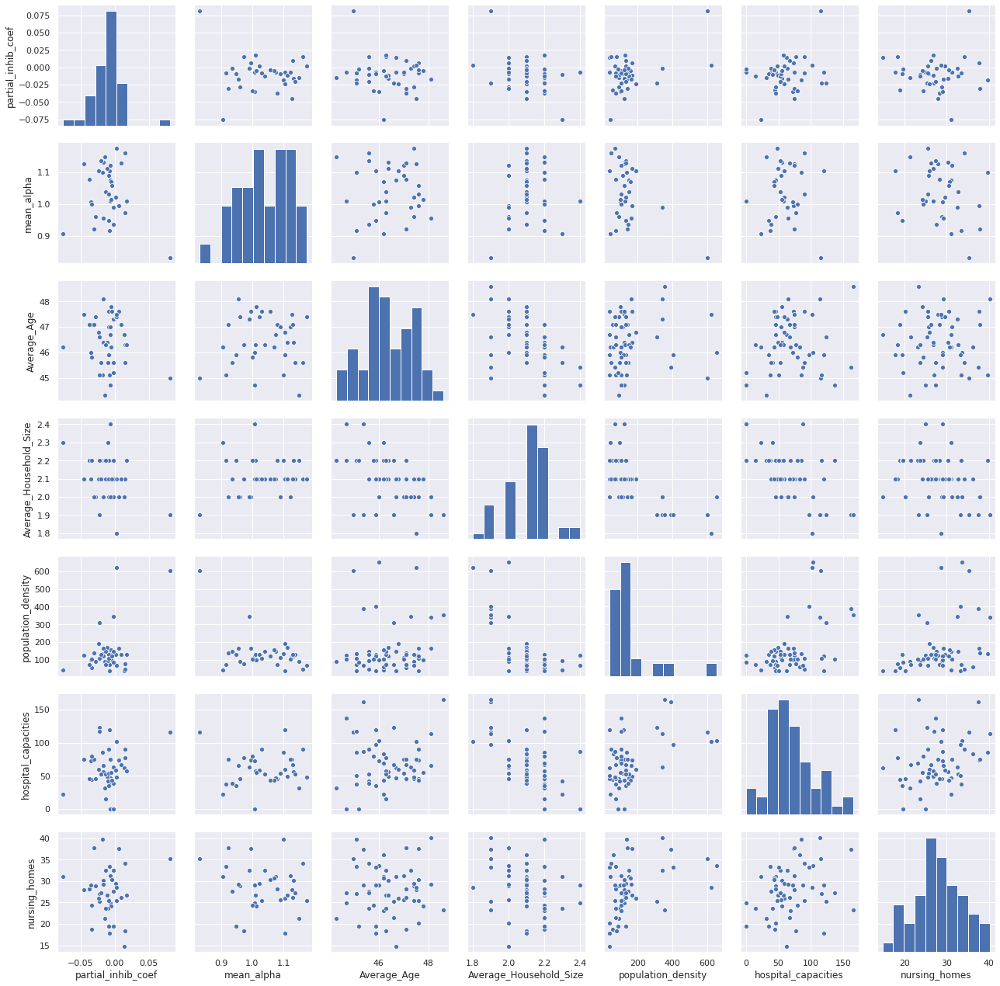

cluster 1


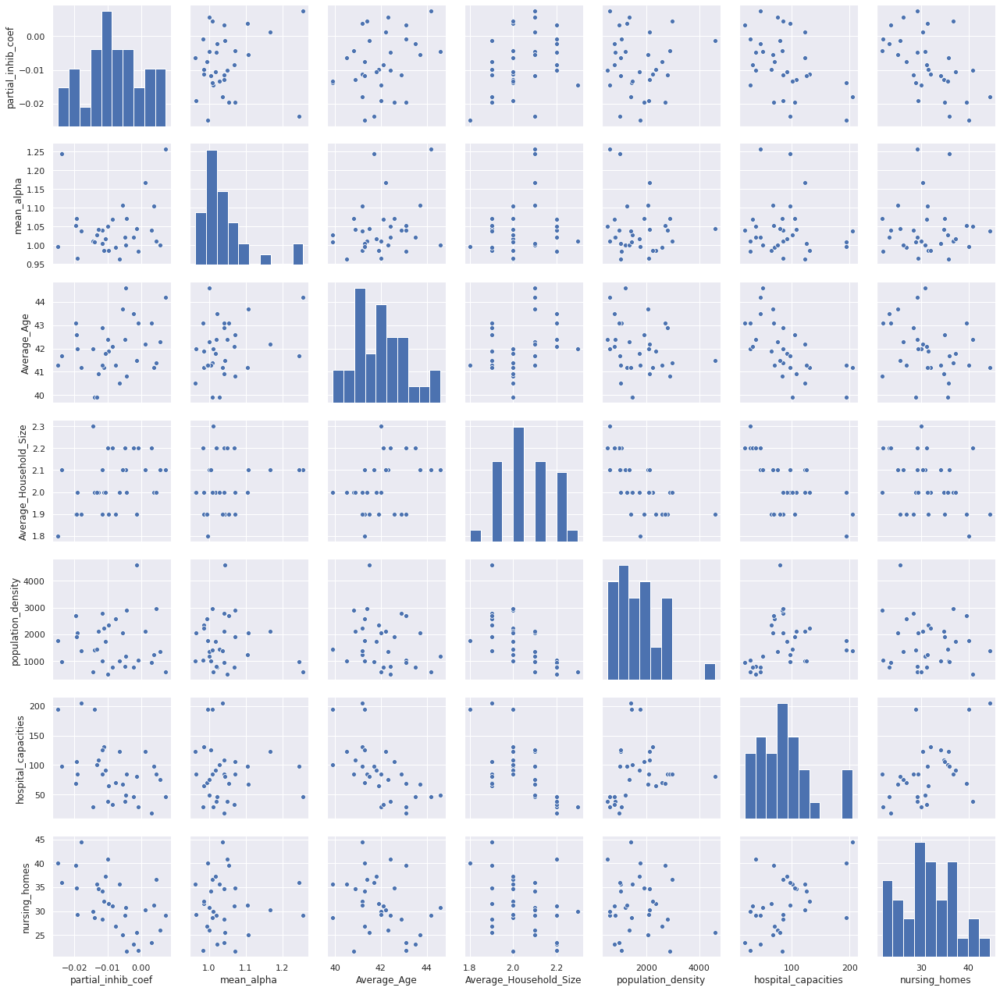

cluster 2


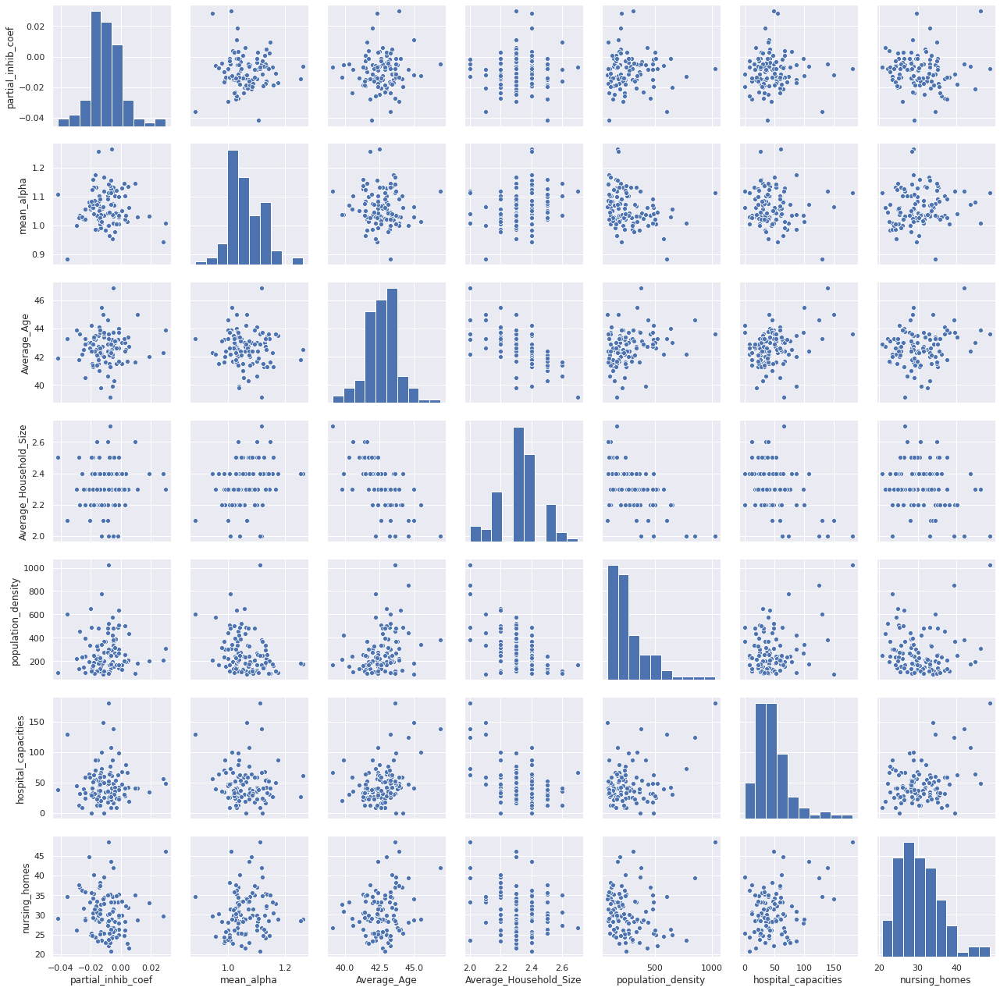

cluster 3


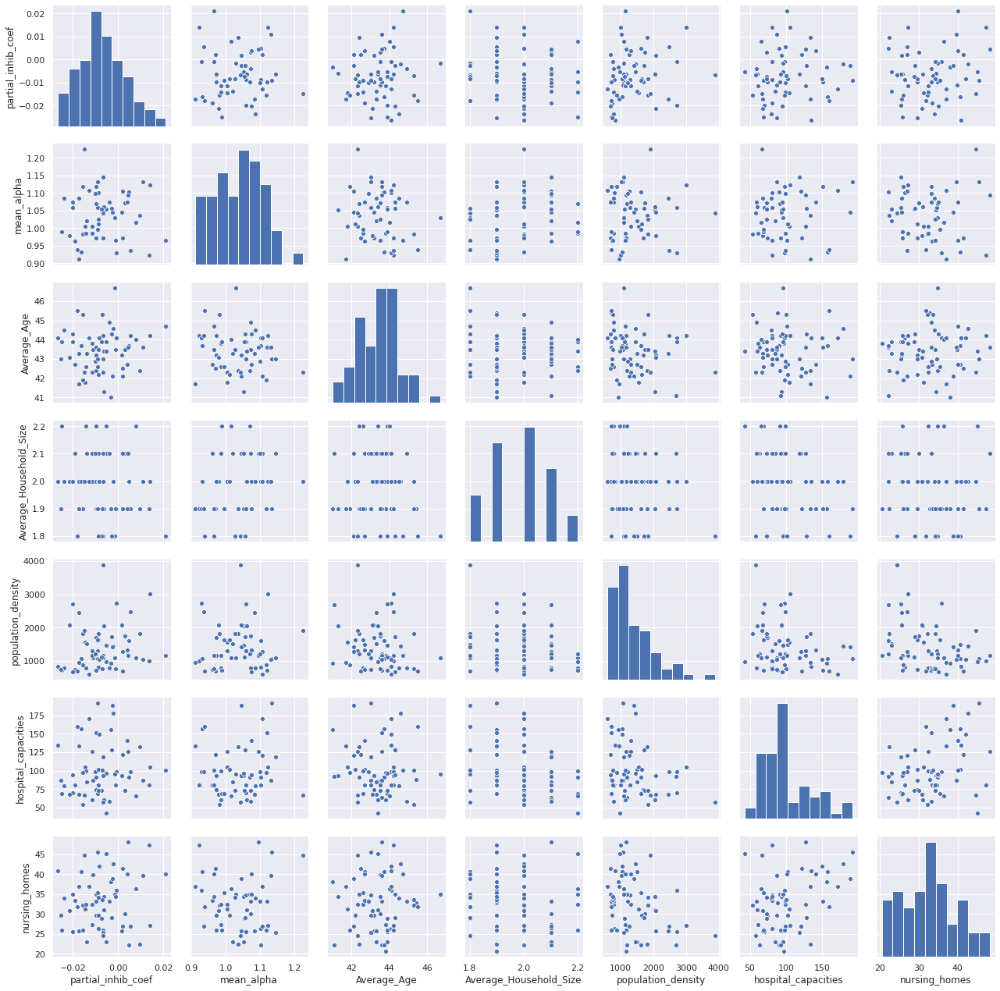

cluster 4


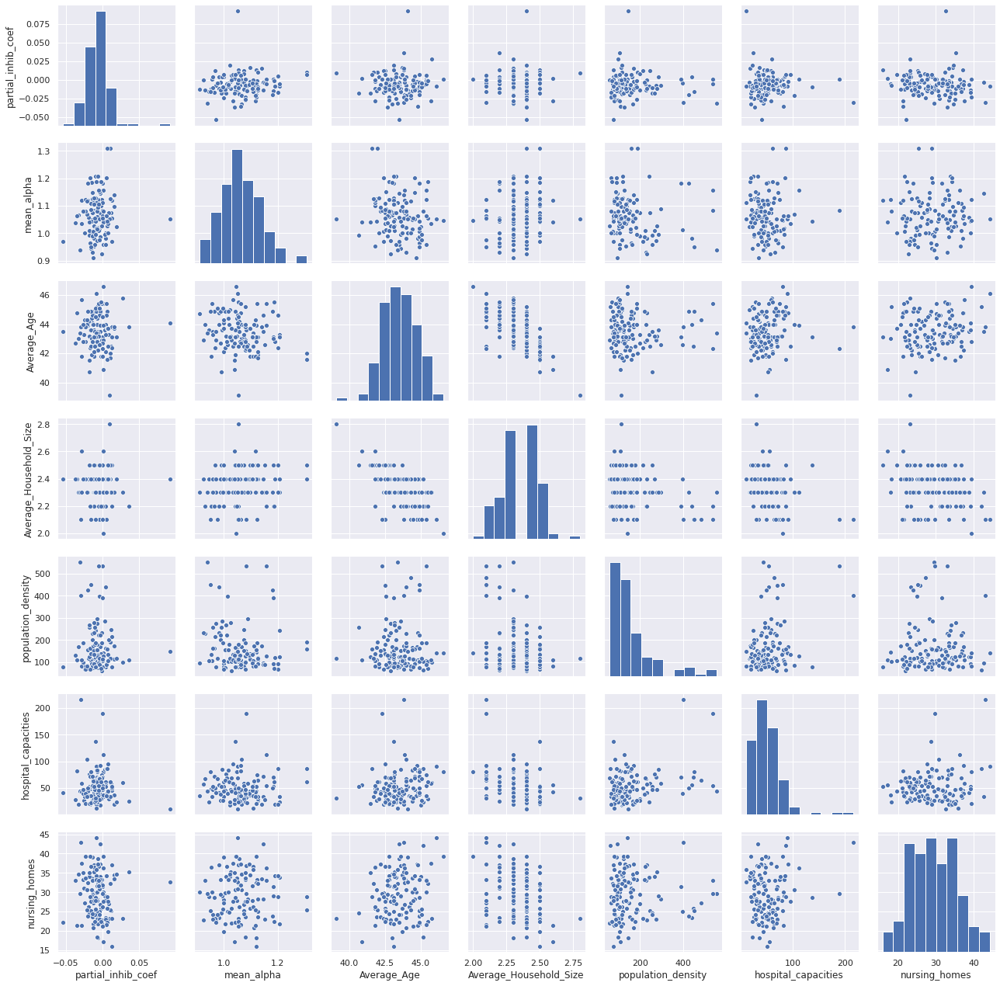

In [ ]:
for clus in np.unique(pairplot_data.cluster):
  print('cluster',clus)
  sns.pairplot(pairplot_data[pairplot_data.cluster==clus].drop(columns='cluster'))
  plt.show()

# Identify Positive Deviants within each cluster

In [ ]:
predictor_variables = ['mean_alpha','Average_Age','Average_Household_Size',
                       'population_density','hospital_capacities','nursing_homes']

- CLUSTER 0 - 
Linear model controlled for 48.8 % of the variance in the performance measure.


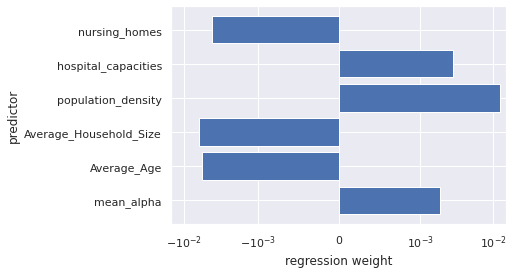

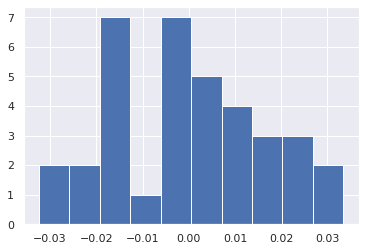

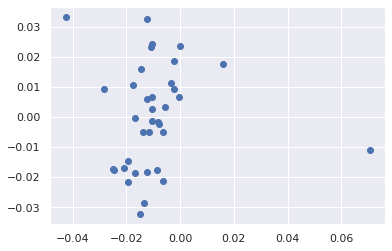

- CLUSTER 1 - 
Linear model controlled for 38.0 % of the variance in the performance measure.


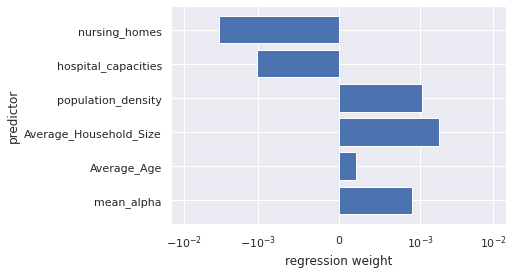

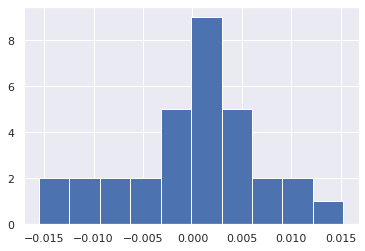

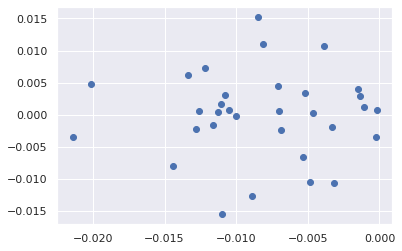

- CLUSTER 2 - 
Linear model controlled for  2.7 % of the variance in the performance measure.


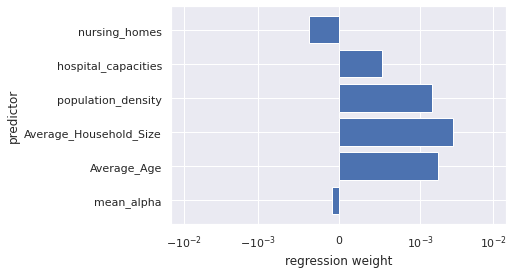

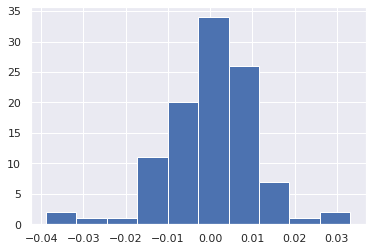

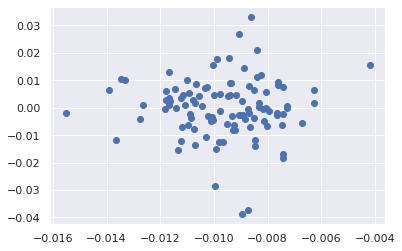

- CLUSTER 3 - 
Linear model controlled for 12.0 % of the variance in the performance measure.


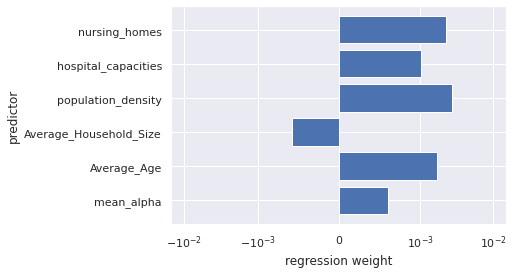

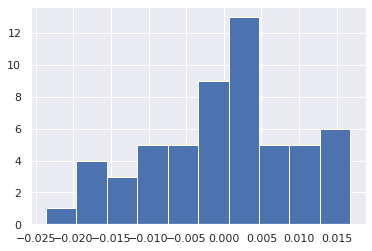

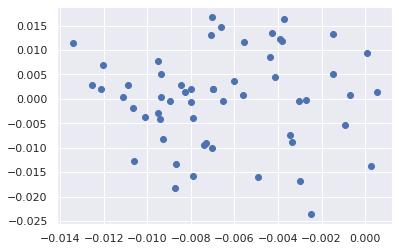

- CLUSTER 4 - 
Linear model controlled for  2.3 % of the variance in the performance measure.


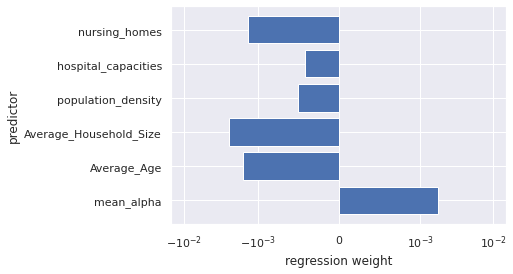

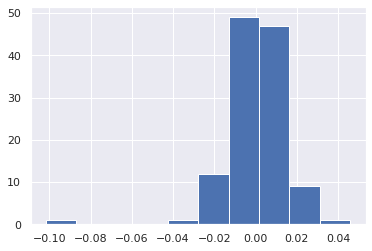

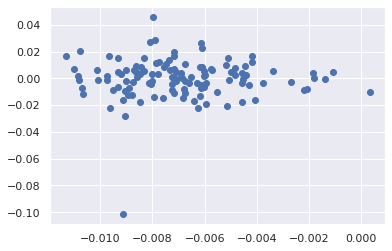

In [ ]:
PDs_per_district = 2
Positive_Deviants = pd.DataFrame()

for cluster in np.unique(all_data.cluster):
    cluster_data = all_data[all_data.cluster == cluster].dropna(axis=0)
    X_unscaled = cluster_data[predictor_variables]
    scaler = StandardScaler()
    X = scaler.fit_transform(X_unscaled)
    y = cluster_data['partial_inhib_coef']
    regr = LinearRegression()
    
    # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2)
    # regr.fit(X_train,y_train)
    
    regr.fit(X,y)
    print('- CLUSTER', cluster, '- \nLinear model controlled for %4.1f %% of the variance in the performance measure.' % 
          (100*regr.score(X,y)))
    # print('- CLUSTER', cluster, '- \nLinear model controlled for %4.1f %% of the training variance in the performance measure.' % 
    #       (100*regr.score(X_train,y_train)))
    # print('- CLUSTER', cluster, '- \nLinear model controlled for %4.1f %% of the test variance in the performance measure.' % 
    #       (100*regr.score(X_test,y_test)))
    
    
    coefs = pd.DataFrame({'predictor':predictor_variables,
                          'regression_weight': regr.coef_})
    plt.barh(coefs.predictor, coefs.regression_weight)
    plt.xlim((-.015,.015))
    plt.xscale('symlog', basex=10, linthreshx=.001)
    plt.xlabel('regression weight')
    plt.ylabel('predictor')
    plt.show()
    cluster_data['predicted_IC'] = regr.predict(X)
    cluster_data['deviance'] =  cluster_data['predicted_IC'] - cluster_data['partial_inhib_coef']
    
    #When the district performs surprisingly well, the partial_inhib_coef will be lower than
    #the predicted one, resulting in positive values here.
    plt.hist(cluster_data['deviance'])
    plt.show()

    plt.scatter(cluster_data['predicted_IC'],cluster_data['deviance'])
    plt.show()
    ranked_by_deviance = cluster_data.sort_values('deviance',ascending=False)
    PDs = ranked_by_deviance.iloc[range(PDs_per_district),]
    Positive_Deviants = Positive_Deviants.append(PDs).reset_index(drop=True)
    

When interpreting the regression weights, keep in mind that lower values of the performance measure indicate a better performance. Thus, the higher a predictor with a negative regression weight, the *better* the performance and vice versa.

                      Cluster: 0


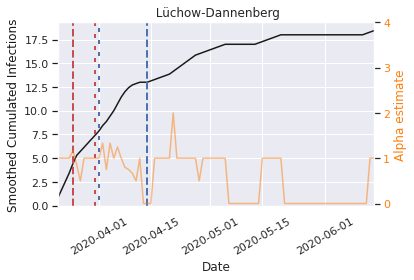

                      Cluster: 0


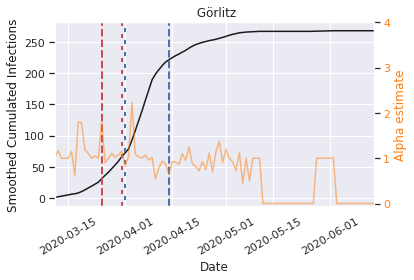

                      Cluster: 1


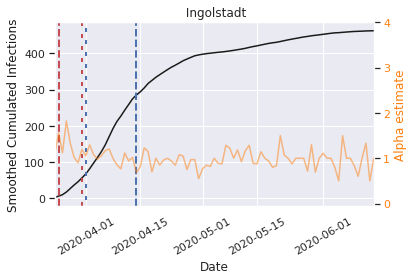

                      Cluster: 1


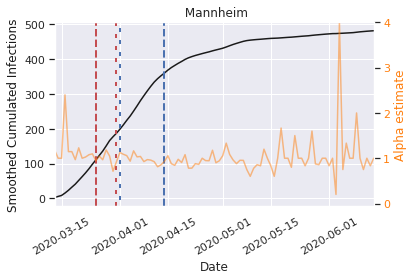

                      Cluster: 2


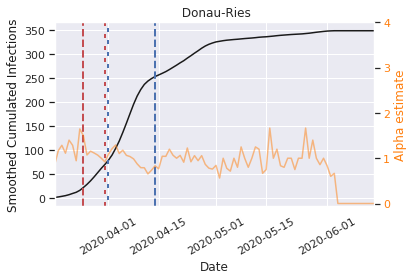

                      Cluster: 2


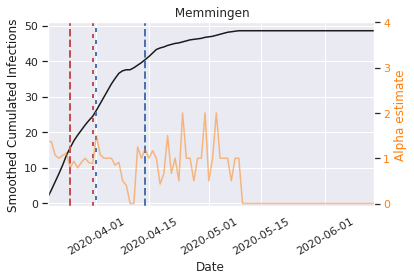

                      Cluster: 3


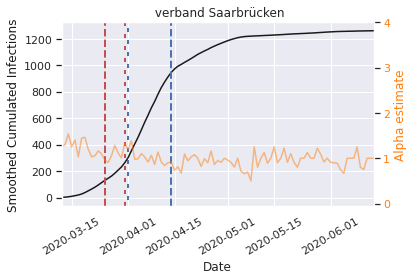

                      Cluster: 3


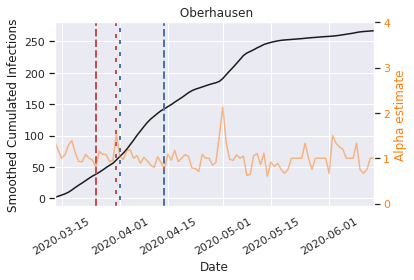

                      Cluster: 4


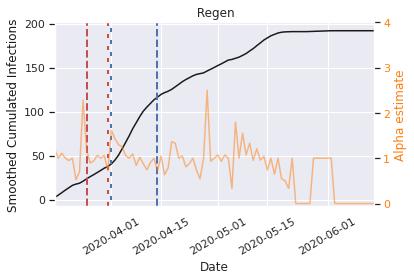

                      Cluster: 4


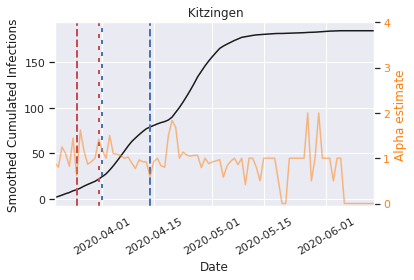

In [ ]:
for index in Positive_Deviants.index:
  print('                      Cluster:', Positive_Deviants.cluster[index])
  infections_.plot_district(Positive_Deviants.districtId[index])

The blue lines indicate the time frame for which the performance measure was calculated, while the red lines indicate the time frame beforehand, for whose mean infection spread we are controlling.
It's clear to see that our performance measure works as intended, as the PD's all show signs of the infection curves leveling off in the blue interval. Districts like Kitzingen, however, already show the limitation that the chosen time frame was likely too short, since they experienced renewed acceleration in the weeks afterwards. We should thus consider widening the performance measure window.

# Does the method of clustering matter?

To test whether the specific way of creating clusters has an influence, I will repeat the analysis above, but with the districts assigned completely randomly to five pseudo-clusters

In [ ]:
random_state = np.random.RandomState(seed=1)
all_data['pseudo_cluster'] = random_state.choice(5, size=all_data.shape[0])

Plot Pseudoclusters

Text(0, 0.5, 'Socioeconomic Status')

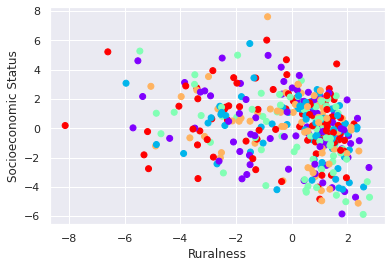

In [ ]:
plt.scatter(all_data['Ruralness_Index'],all_data['Socioecon_Index'],
              c=all_data['pseudo_cluster'],cmap='rainbow')
plt.xlabel('Ruralness')
plt.ylabel('Socioeconomic Status')

- PSEUDOCLUSTER 0 - 
Linear model controlled for  6.0 % of the variance in the performance measure.


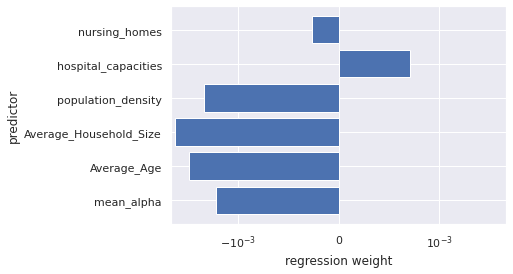

- PSEUDOCLUSTER 1 - 
Linear model controlled for  2.7 % of the variance in the performance measure.


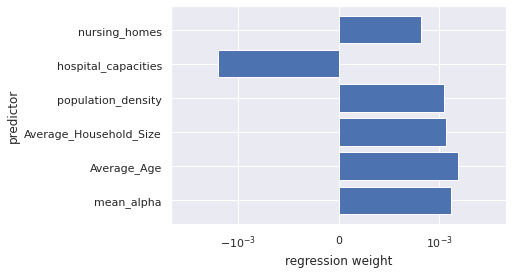

- PSEUDOCLUSTER 2 - 
Linear model controlled for  3.8 % of the variance in the performance measure.


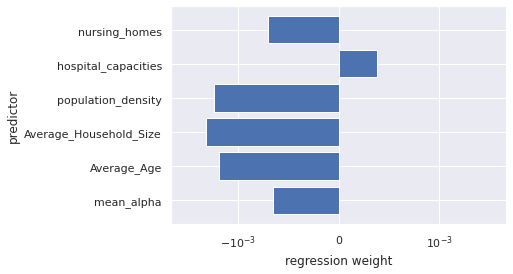

- PSEUDOCLUSTER 3 - 
Linear model controlled for 11.8 % of the variance in the performance measure.


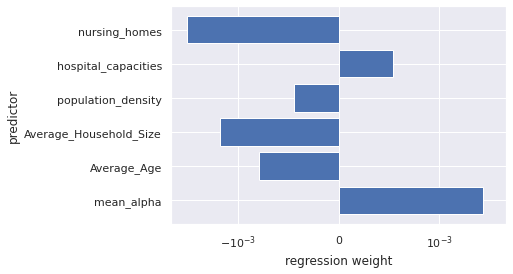

- PSEUDOCLUSTER 4 - 
Linear model controlled for  5.6 % of the variance in the performance measure.


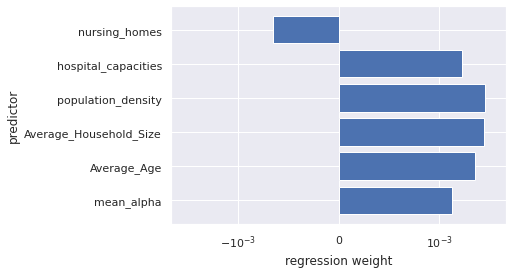

In [ ]:
for cluster in np.unique(all_data.pseudo_cluster):
    cluster_data = all_data[all_data.pseudo_cluster == cluster].dropna(axis=0)
    X_unscaled = cluster_data[predictor_variables]
    scaler = StandardScaler()
    X = scaler.fit_transform(X_unscaled)
    y = cluster_data['partial_inhib_coef']
    regr = LinearRegression()
    regr.fit(X,y)
    print('- PSEUDOCLUSTER', cluster, '- \nLinear model controlled for %4.1f %% of the variance in the performance measure.' % (100*regr.score(X,y)))
    coefs = pd.DataFrame({'predictor':predictor_variables,
                          'regression_weight': regr.coef_})
    plt.barh(coefs.predictor, coefs.regression_weight)
    plt.xlim((-.0055,.0055))
    plt.xscale('symlog', basex=10, linthreshx=.001)
    plt.xlabel('regression weight')
    plt.ylabel('predictor')
    plt.show()
    

# DPPD without Clustering?

In light of recent feedback, we wanted to compare the results above with an analysis that skips the clustering to identify homologues, and instead uses the ruralness and socioeconomic indices as additional predictors in the statistical control.

In [ ]:
predictor_variables_extended = ['mean_alpha','Average_Age','Average_Household_Size',
                       'population_density','hospital_capacities','nursing_homes',
                       'Ruralness_Index', 'Socioecon_Index']

Linear model controlled for  1.7 % of the variance in the performance measure.


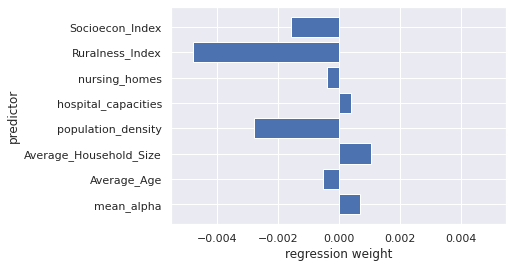

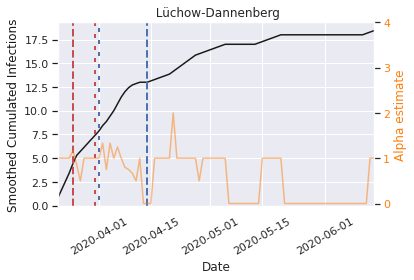

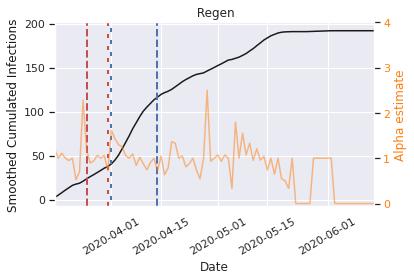

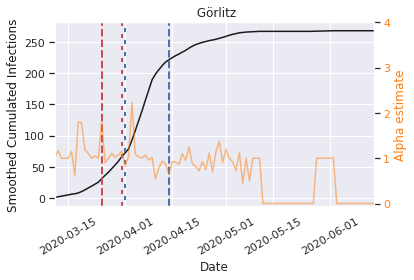

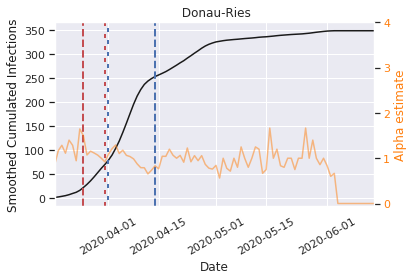

...

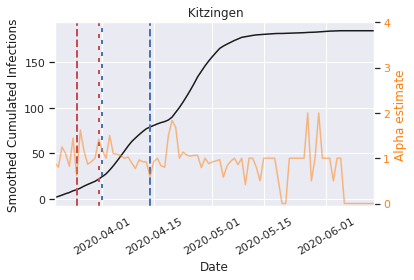

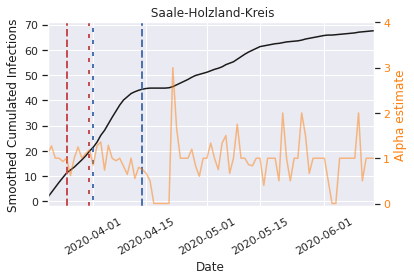

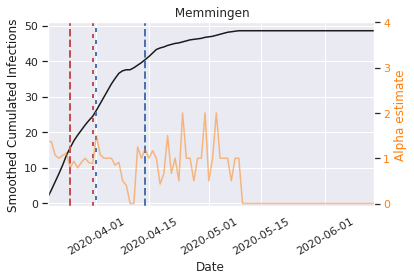

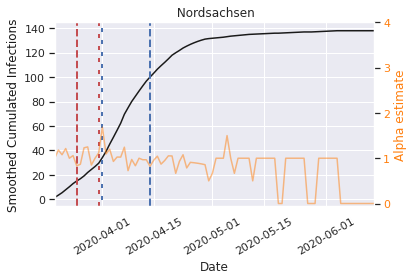

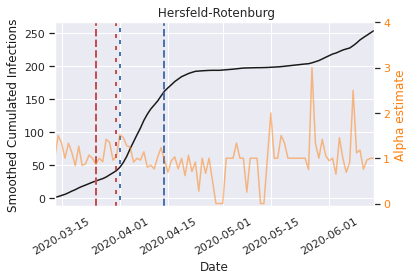

In [ ]:
total_number_PDs = 10

model_data = all_data.dropna(axis=0).copy()
X_unscaled = model_data[predictor_variables_extended]
scaler = StandardScaler()
X = scaler.fit_transform(X_unscaled)
y = model_data['partial_inhib_coef']
regr = LinearRegression()
regr.fit(X,y)
print('Linear model controlled for %4.1f %% of the variance in the performance measure.' % (100*regr.score(X,y)))
coefs = pd.DataFrame({'predictor':predictor_variables_extended,
                      'regression_weight': regr.coef_})
plt.barh(coefs.predictor, coefs.regression_weight)
plt.xlim((-.0055,.0055))
plt.xlabel('regression weight')
plt.ylabel('predictor')
plt.show()
      
model_data['predicted_IC'] = regr.predict(X)
model_data['deviance'] = model_data['predicted_IC'] - model_data['partial_inhib_coef']
ranked_by_deviance = model_data.sort_values('deviance', ascending=False)
Positive_Deviants_2 = ranked_by_deviance.iloc[range(total_number_PDs)]

for district in Positive_Deviants_2.districtId:
  infections_.plot_district(district)

In [ ]:
pd_agreement_count = 0
for PD in Positive_Deviants_2.districtId:
   if PD in Positive_Deviants.districtId.values:
     pd_agreement_count += 1
print(pd_agreement_count, 'out of', 
      len(Positive_Deviants_2.districtId), 'PD\'s identified without clustering were also part of the',
      len(Positive_Deviants.districtId), 'PD\'s identified with clustering.')

6 out of 10 PD's identified without clustering were also part of the 10 PD's identified with clustering.


There's substantial agreement between the two procedures, however, we might be systematically missing PD's from one or more specific clusters. This could lead us to miss e.g. behaviors making very rural areas perform really well, when the PD's found in both procedures tend to be urban ones. I'd prefer sticking to the clustering.

In [ ]:
Positive_Deviants_2.cluster

36     0
253    4
352    0
316    2
340    0
299    4
391    0
307    2
357    0
137    4
Name: cluster, dtype: int32

The above confirms that we're mostly getting our PD's from clusters 4 and 2, with cluster 1 being entirely absent from our findings. Of the most financially troubled clusters 3 and 0, there's only one PD each. This entails the risk of identifying PD explanators not easily transferable to these districts.

We also see from the variances explained by the different models that clustering seems to be the more productive approach: When using socioeconomic status and ruralness as merely two more predictors, we controlled for only 3% of the variance in the performance measure, whereas at least the models for clusters 0, 1 and 3 were able to control for substantial parts of the performance measure's variance.

#Next Steps

There are multiple avenues for refining this analysis further. The most obvious would be to include more structural variables in the controlling model, like a more granular measure of the age structure. Right now, we're using the average age from the 2011 census, because it was ready-at-hand. We might extend this to the 25-, 50- and 75-percentile boarders. Looking into more complex statistical models than the linear regression would also be an interesting road to take, although 400 districts, spread across 5 clusters, will likely be too small a sample for most advanced procedures.
Next, we've already seen that we should probably widen the time range for which we calculate the performance measure. We're also not yet considering fatalities in any way.


Ziad also brought up the interesting idea to do a separate analysis looking only at infections within the elderly population, since they are the least likely to be able to clear the virus themselves. This can be achieved by filtering the raw infections reports using the age group information provided by the RKI:

In [ ]:
ages_to_include = ['A60-A79', 'A80+']
rki_raw_elderly = rki_raw[rki_raw.Altersgruppe.isin(ages_to_include)].copy()
infections_elderly = Infections(infection_reports=rki_raw_elderly)

# Random Forest

Install commands for feature importance

In [ ]:
pip install rfpimp

     |████████████████████████████████| 163kB 3.9MB/s 
  Created wheel for rfpimp: filename=rfpimp-1.3.5-cp36-none-any.whl size=10260 sha256=d67ea36d41be0793ea035d5dd079bca7b926b7a341c2359bc0f79eec2661d495
  Stored in directory: /root/.cache/pip/wheels/2a/c8/bf/80f91224be00870f84a85aa1782cf6cd62c1289a173b66b8e9
  Created wheel for stratx: filename=stratx-0.4-cp36-none-any.whl size=35059 sha256=0767eb0247626cdec2bd45a0cb7cc61d27490e871387f79db0e77ddd1b0a2ae6
  Stored in directory: /root/.cache/pip/wheels/7f/44/3a/110013d8115971c482c5537fe898ae1168436f6370115f665f
Successfully built rfpimp stratx


In [ ]:
pip install eli5

     |████████████████████████████████| 112kB 2.8MB/s 


Import libraries for feature importance calculation

In [ ]:
from rfpimp import plot_corr_heatmap
from sklearn.metrics import r2_score
from rfpimp import permutation_importances
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.base import clone 

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.ensemble.forest module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version

Preparation steps for feature importance calculation and visualisation

In [ ]:
# udfs ----

# function for creating a feature importance dataframe
def imp_df(column_names, importances,cluster):
    df = pd.DataFrame({'feature': column_names,
                       'feature_importance': importances,
                       'cluster': cluster}) \
            .reset_index(drop = True)
           #.sort_values('feature_importance', ascending = False) \

    return df

# plotting a feature importance dataframe (horizontal barchart)
def var_imp_plot(imp_df, title):
    imp_df.columns = ['feature', 'feature_importance']
    sns.barplot(x = 'feature_importance', y = 'feature', data = imp_df, orient = 'h', color = 'royalblue') \
       .set_title(title, fontsize = 20)

## Random Forest and Feature Importance Calculation

- CLUSTER 0 - 
 Random Forest Regressor controlled for 81.0 % of the variance in the performance measure.


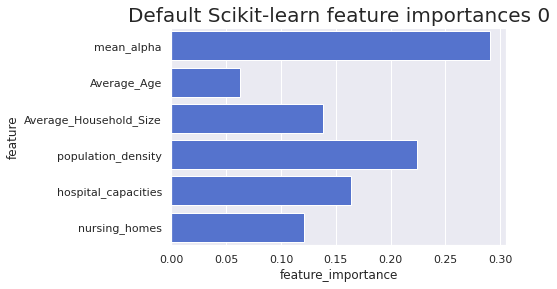

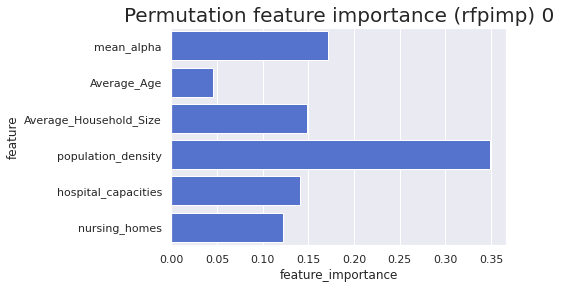

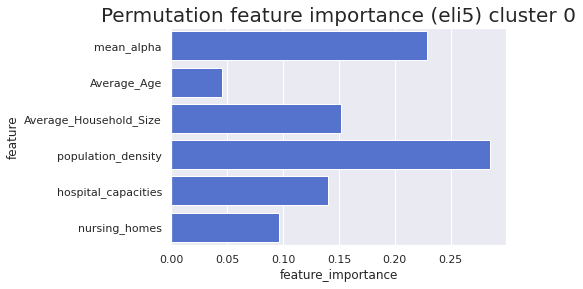

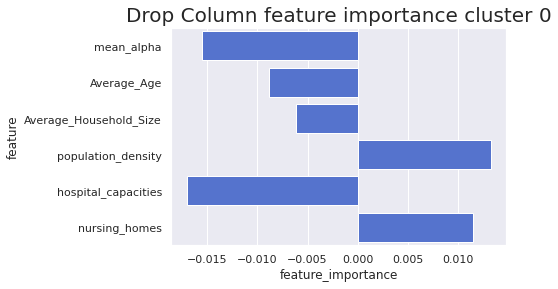

- CLUSTER 1 - 
 Random Forest Regressor controlled for 83.7 % of the variance in the performance measure.


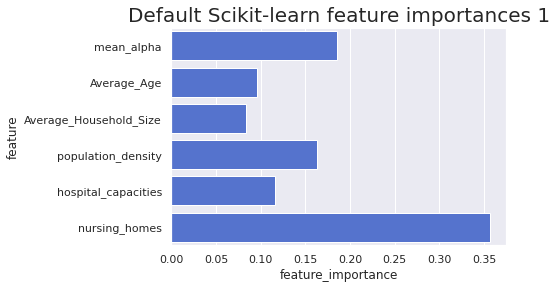

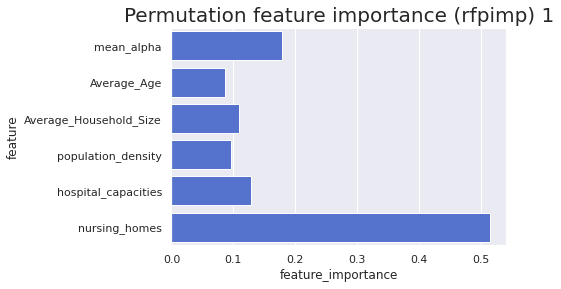

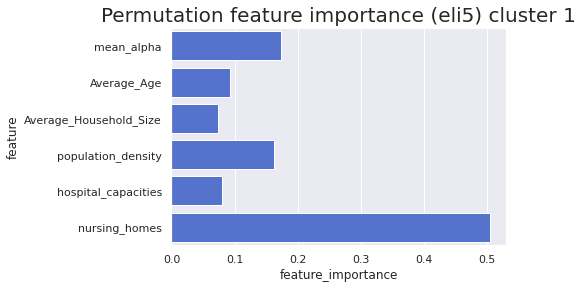

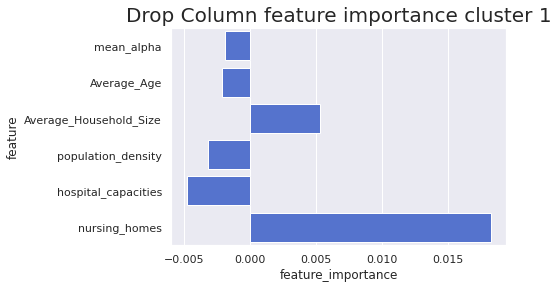

- CLUSTER 2 - 
 Random Forest Regressor controlled for 83.6 % of the variance in the performance measure.


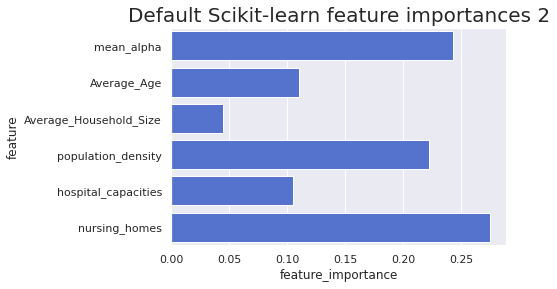

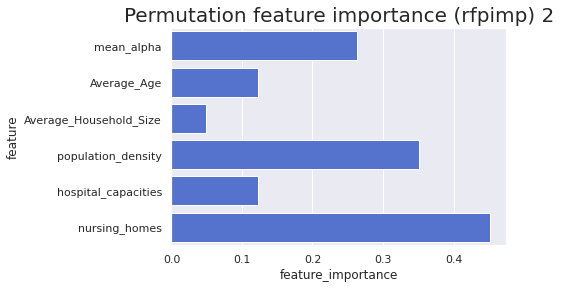

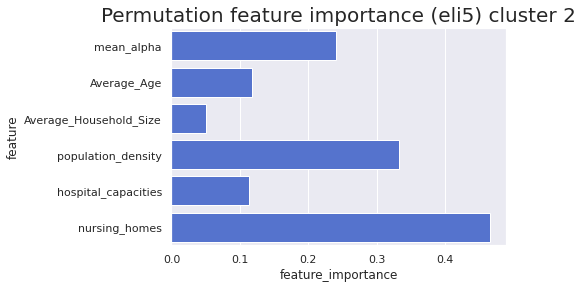

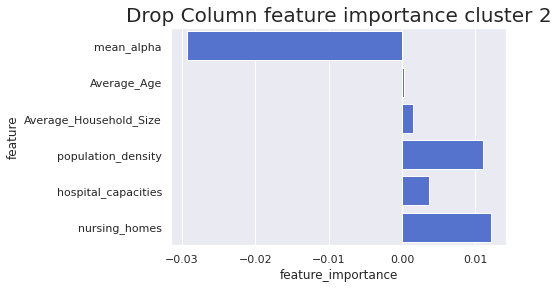

- CLUSTER 3 - 
 Random Forest Regressor controlled for 86.8 % of the variance in the performance measure.


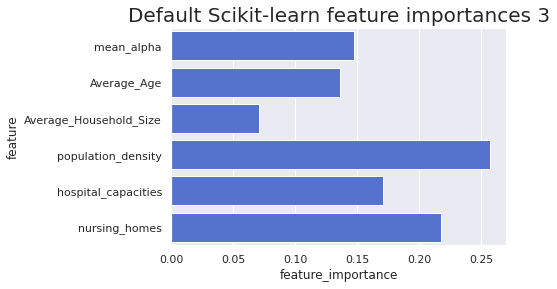

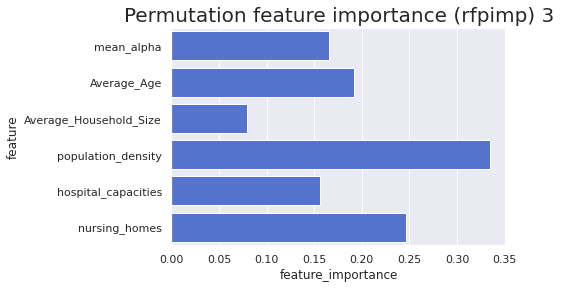

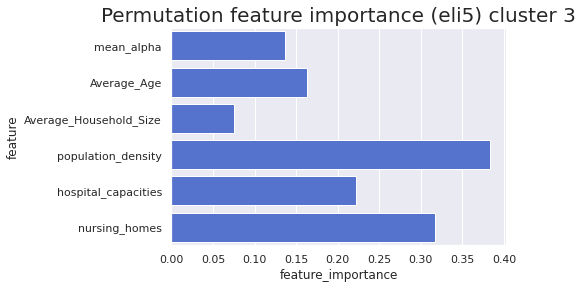

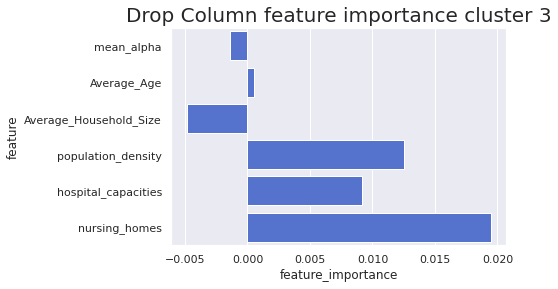

- CLUSTER 4 - 
 Random Forest Regressor controlled for 81.9 % of the variance in the performance measure.


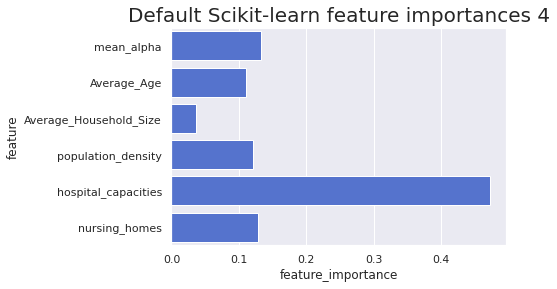

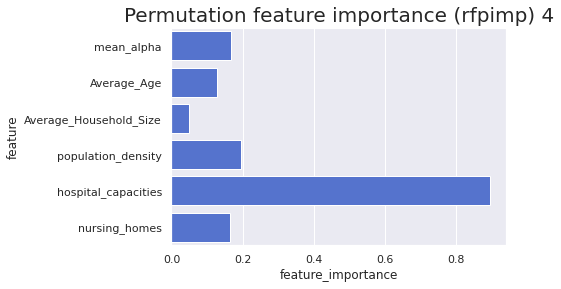

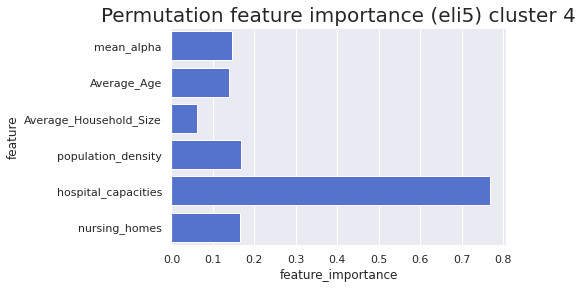

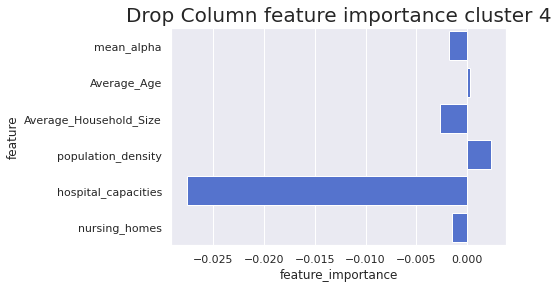

In [ ]:
PDs_per_district_rf = 2
Positive_Deviants_rf = pd.DataFrame()
fi_all_rf = pd.DataFrame() 

for cluster in np.unique(all_data.cluster):
    cluster_data_rf = all_data[all_data.cluster == cluster].dropna(axis=0)
    X_unscaled_rf = cluster_data_rf[predictor_variables]
    scaler_rf = StandardScaler()
    X_rf = scaler_rf.fit_transform(X_unscaled_rf)
    #X_rf = scaler_rf.fit(X_unscaled_rf)
    X_df_rf = pd.DataFrame(X_rf, index=X_unscaled_rf.index, columns=X_unscaled_rf.columns)
    #X_df_rf = pd.DataFrame(scaler_rf.transform(X_unscaled_rf), index=X_unscaled_rf.index.values, columns=X_unscaled_rf.columns.values)
    y_rf = cluster_data_rf['partial_inhib_coef']
    rf = RandomForestRegressor(n_estimators = 100, random_state = 42)
    rf.fit(X_df_rf,y_rf)

    cluster_data_rf['predicted_IC'] = rf.predict(X_df_rf)
    cluster_data_rf['deviance'] =  cluster_data_rf['predicted_IC'] - cluster_data_rf['partial_inhib_coef']
    #When the district performs surprisingly well, the partial_inhib_coef will be lower than
    #the predicted one, resulting in positive values here.
    ranked_by_deviance_rf = cluster_data_rf.sort_values('deviance',ascending=False)
    PDs_rf = ranked_by_deviance_rf.iloc[range(PDs_per_district_rf),]
    Positive_Deviants_rf = Positive_Deviants_rf.append(PDs_rf).reset_index(drop=True)

    # calculate model R2 score per cluster
    print('- CLUSTER', cluster, '- \n Random Forest Regressor controlled for %4.1f %% of the variance in the performance measure.' % (100*rf.score(X_rf,y_rf)))

    # calculate default feature importance per cluster: https://towardsdatascience.com/an-implementation-and-explanation-of-the-random-forest-in-python-77bf308a9b76
    #--> how much each feature contributes to decreasing the weighted impurity

    fi_rf = pd.DataFrame({'feature': list(X_df_rf.columns),
                   'feature_importance': rf.feature_importances_,
                   'cluster': cluster})#.\
                    #sort_values('importance', ascending = False)
    fi_all_rf = pd.concat((fi_all_rf, fi_rf))

    # visualise default feature importance
    sns.barplot(x = 'feature_importance', y = 'feature', data = fi_rf, orient = 'h', color = 'royalblue') \
       .set_title('Default Scikit-learn feature importances ' + str(cluster), fontsize = 20)
    plt.show()

    #calculate & visualise permutation feature importance with rfpimp: https://towardsdatascience.com/explaining-feature-importance-by-example-of-a-random-forest-d9166011959e
    #--> directly measures feature importance by observing how random re-shuffling (thus preserving the distribution of the variable) of each predictor influences model performance

    def r2(rf, X_df_rf, y_rf):
      return r2_score(y_rf, rf.predict(X_df_rf))

    perm_imp_rfpimp_prep = permutation_importances(rf, 
                                              X_df_rf, 
                                              y_rf,
                                              r2)
    #put the columns in the same order as default feature importance
    perm_imp_rfpimp_prep2 = perm_imp_rfpimp_prep.reindex(index=fi_rf['feature'])
    perm_imp_rfpimp = perm_imp_rfpimp_prep2.reset_index()
    
    var_imp_plot(perm_imp_rfpimp, 'Permutation feature importance (rfpimp) '+ str(cluster))
    plt.show()

    #calculate & visualise permutation feature importance with eli5:
    perm = PermutationImportance(rf, cv = None, refit = False, n_iter = 50).fit(X_df_rf, y_rf)
    perm_imp_eli5 = imp_df(X_df_rf.columns, perm.feature_importances_,cluster)
    var_imp_plot(perm_imp_eli5[['feature','feature_importance']], 'Permutation feature importance (eli5) cluster ' + str(cluster))
    plt.show()

    #calculate & visualise drop-column feature importance
    #--> we investigate the importance of a feature by comparing a model with all features versus a model with this feature dropped for training
    
    def drop_col_feat_imp(model, X_df_rf, y_rf, random_state = 42):
    
      # clone the model to have the exact same specification as the one initially trained
      model_clone = clone(model)
      # set random_state for comparability
      model_clone.random_state = random_state
      # training and scoring the benchmark model
      model_clone.fit(X_df_rf, y_rf)
      benchmark_score = model_clone.score(X_df_rf, y_rf)
      # list for storing feature importances
      importances_rf = []

      # iterating over all columns and storing feature importance (difference between benchmark and new model)
      for col in X_df_rf.columns:
          model_clone = clone(model)
          model_clone.random_state = random_state
          model_clone.fit(X_df_rf.drop(col, axis = 1), y_rf)
          drop_col_score = model_clone.score(X_df_rf.drop(col, axis = 1), y_rf)
          importances_rf.append(benchmark_score - drop_col_score)
      
      importances_df_rf = imp_df(X_df_rf.columns, importances_rf,cluster)
      return importances_df_rf

    drop_imp = drop_col_feat_imp(rf, X_df_rf, y_rf)
    var_imp_plot(drop_imp[['feature','feature_importance']], 'Drop Column feature importance cluster ' + str(cluster))
    plt.show()

## Random Forest Identify Positive Deviants within Each Cluster

                      Cluster: 0


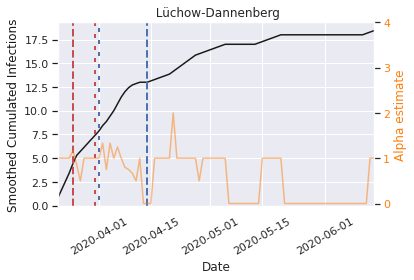

                      Cluster: 0


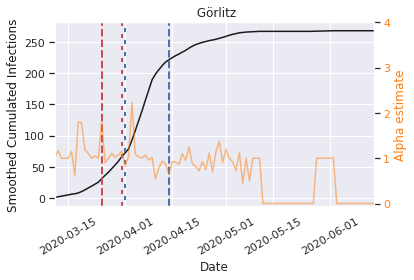

                      Cluster: 1


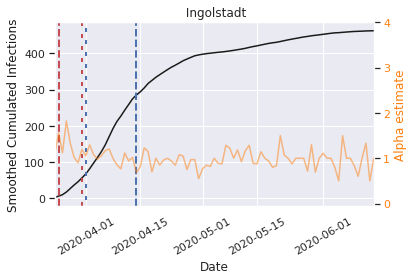

                      Cluster: 1


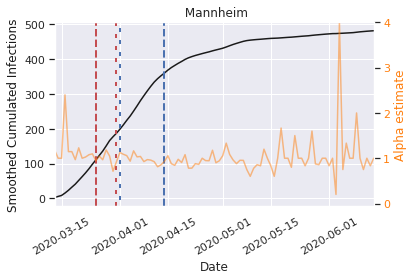

                      Cluster: 2


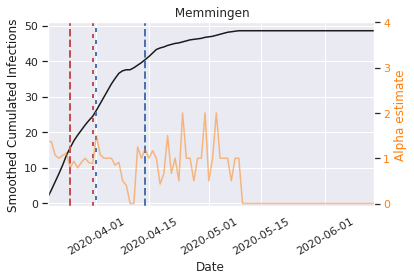

                      Cluster: 2


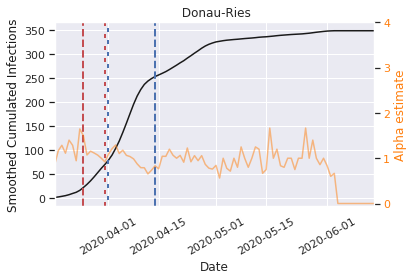

                      Cluster: 3


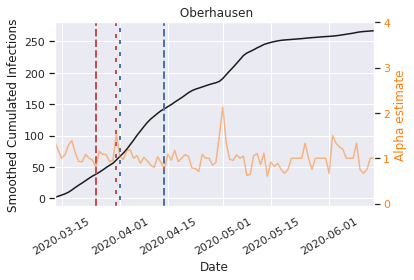

                      Cluster: 3


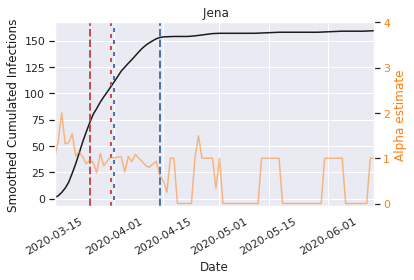

                      Cluster: 4


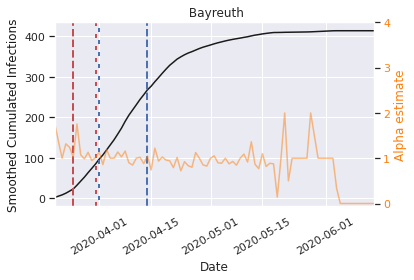

                      Cluster: 4


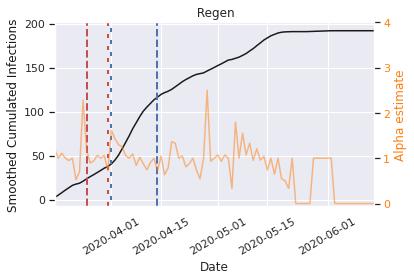

In [ ]:
for index in Positive_Deviants_rf.index:
  print('                      Cluster:', Positive_Deviants_rf.cluster[index])
  infections_.plot_district(Positive_Deviants_rf.districtId[index])

# For Visualisation
https://towardsdatascience.com/visualizing-decision-trees-with-python-scikit-learn-graphviz-matplotlib-1c50b4aa68dc

https://colab.research.google.com/drive/1_Qb92Hj5_f2rpta67JC0JKXwE2581Ar-#scrollTo=xc9-OzS3pZVD

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydot 

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [ ]:
cluster_data_dt = all_data[all_data.cluster == 1].dropna(axis=0)
X_unscaled_dt = cluster_data_dt[predictor_variables]
scaler_dt = StandardScaler()
X_dt = scaler.fit_transform(X_unscaled_dt)
X_df_dt = pd.DataFrame(X_dt, index=X_unscaled_dt.index, columns=X_unscaled_dt.columns)
y_dt = cluster_data_dt['partial_inhib_coef']

In [ ]:
clf = DecisionTreeRegressor(max_depth = 2, 
                             random_state = 0)
# Step 3: Train the model on the data
clf.fit(X_df_dt, y_dt)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=2,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [ ]:
fn=['mean_alpha','Average Age','Average_Household_Size','population_density','hospital_capacities','nursing_homes']

##Decision Tree Visualisation with scikit-learn

In [ ]:
#tree.plot_tree(clf);

##Decision Tree Visualisation with Matplotlib

In [ ]:
# fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (6,6), dpi=300)
# tree.plot_tree(clf,
#                feature_names = fn, 
#                #class_names=cn,
#                filled = True);
# #fig.savefig('imagename.png')

##Decision Tree Visualisation with Graphviz

In [ ]:
!apt install -y graphviz
!pip install graphviz

Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.40.1-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 43 not upgraded.


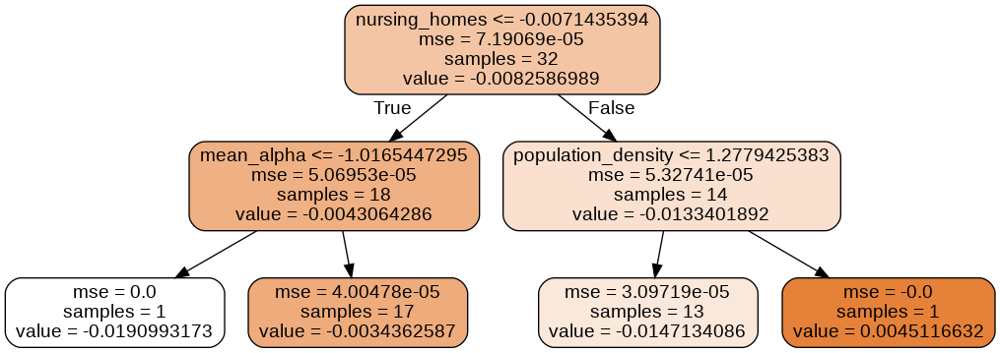

In [ ]:
dot_data = StringIO()  
export_graphviz(clf, out_file=dot_data,feature_names=fn,filled=True,rounded=True,precision=10)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png()) 

## Random Forest Visualisation

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,2), dpi=3000)
tree.plot_tree(rf.estimators_[0],
               feature_names = fn, 
               #class_names=cn,
               filled = True);
#fig.savefig('rf_individualtree.png')

Visualisation of the first 5 deision trees (= estimators) in the random forest 
https://towardsdatascience.com/visualizing-decision-trees-with-python-scikit-learn-graphviz-matplotlib-1c50b4aa68dc

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(rf.estimators_[index],
                   feature_names = fn, 
                   #class_names=cn,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)

# Random Forest with train - test split

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

- CLUSTER 0 - 
 Random Forest Regressor controlled for 80.3 % of the variance in the performance measure (training set).
- CLUSTER 0 - 
 Random Forest Regressor controlled for -81.3 % of the variance in the performance measure (test set).


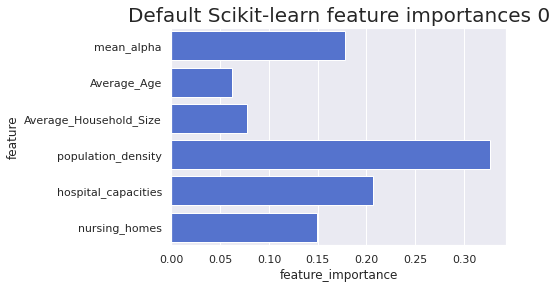

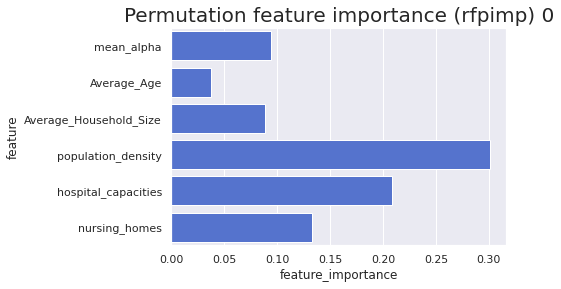

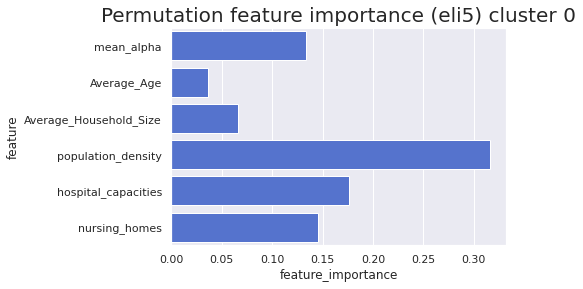

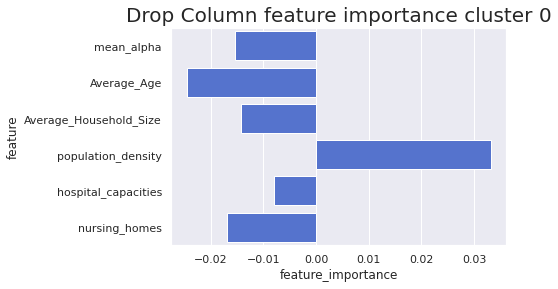

- CLUSTER 1 - 
 Random Forest Regressor controlled for 85.2 % of the variance in the performance measure (training set).
- CLUSTER 1 - 
 Random Forest Regressor controlled for -47.1 % of the variance in the performance measure (test set).


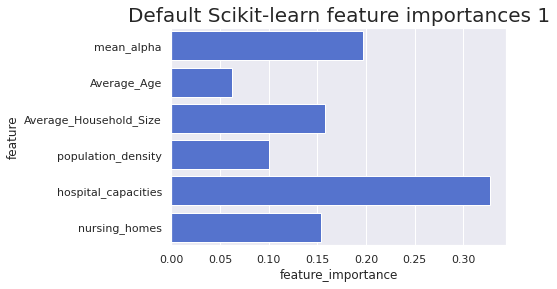

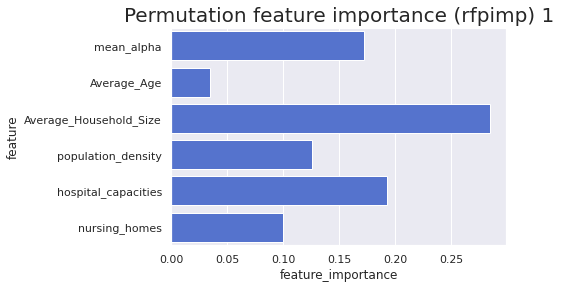

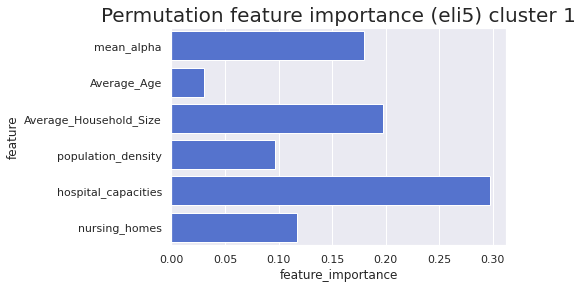

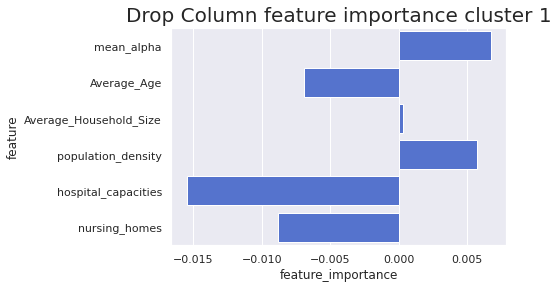

- CLUSTER 2 - 
 Random Forest Regressor controlled for 84.3 % of the variance in the performance measure (training set).
- CLUSTER 2 - 
 Random Forest Regressor controlled for -19.2 % of the variance in the performance measure (test set).


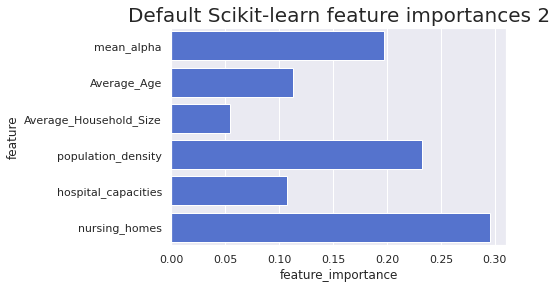

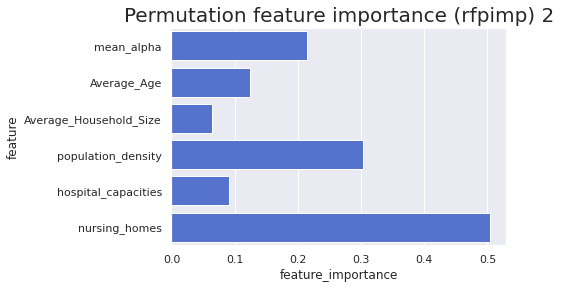

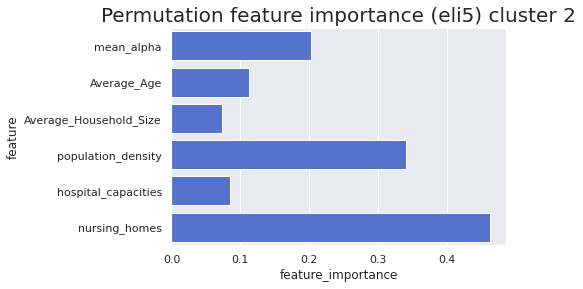

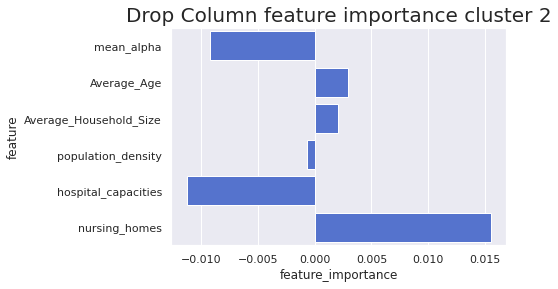

- CLUSTER 3 - 
 Random Forest Regressor controlled for 86.0 % of the variance in the performance measure (training set).
- CLUSTER 3 - 
 Random Forest Regressor controlled for -29.9 % of the variance in the performance measure (test set).


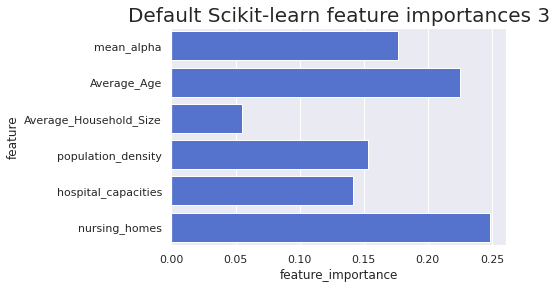

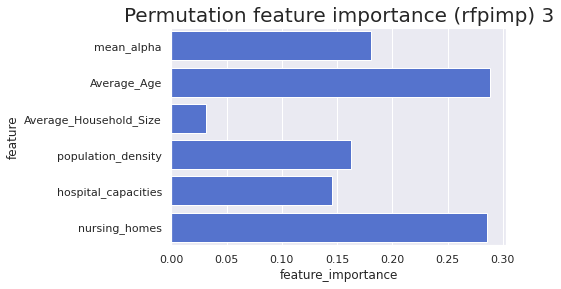

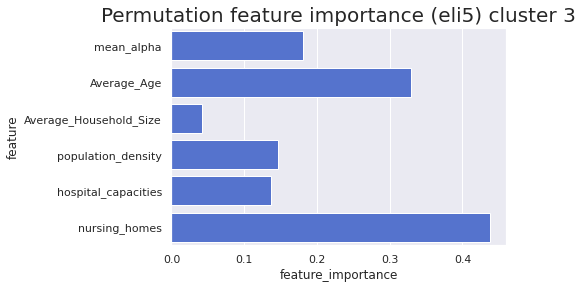

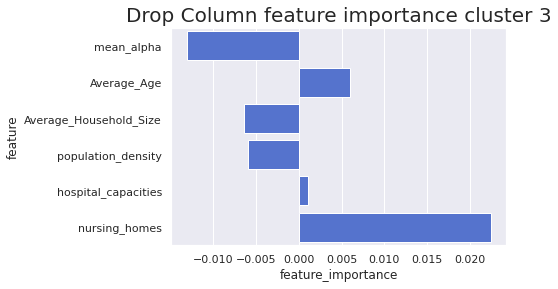

- CLUSTER 4 - 
 Random Forest Regressor controlled for 81.4 % of the variance in the performance measure (training set).
- CLUSTER 4 - 
 Random Forest Regressor controlled for -33.6 % of the variance in the performance measure (test set).


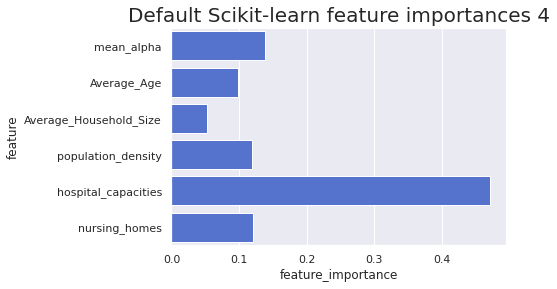

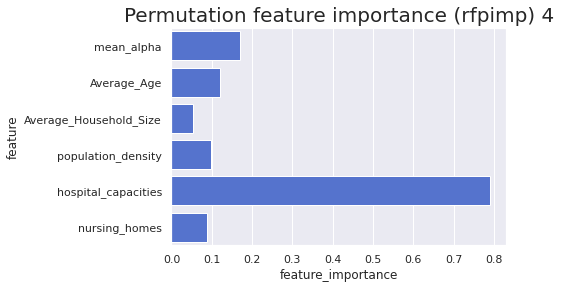

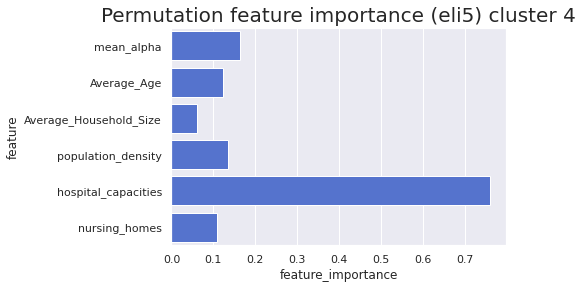

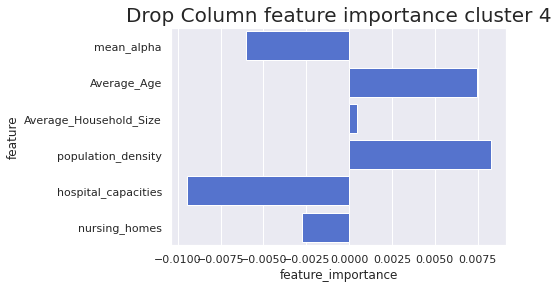

In [ ]:
PDs_per_district_rf_tt = 2
Positive_Deviants_rf_tt = pd.DataFrame()
fi_all_rf_tt = pd.DataFrame() 

for cluster in np.unique(all_data.cluster):
    cluster_data_rf_tt = all_data[all_data.cluster == cluster].dropna(axis=0)
    X_unscaled_rf_tt = cluster_data_rf_tt[predictor_variables]
    scaler_rf_tt = StandardScaler()
    X_rf_tt = scaler_rf_tt.fit_transform(X_unscaled_rf_tt)
    X_df_rf_tt = pd.DataFrame(X_rf_tt, index=X_unscaled_rf_tt.index, columns=X_unscaled_rf_tt.columns)
    y_rf_tt = cluster_data_rf_tt['partial_inhib_coef']
    rf_tt = RandomForestRegressor(random_state = 42)
    X_train_tt, X_test_tt, y_train_tt, y_test_tt = train_test_split(X_df_rf_tt, y_rf_tt, test_size=0.30,random_state = 42)
    rf_tt.fit(X_train_tt,y_train_tt)

    cluster_data_rf_pred_tt  = X_test_tt.merge(y_test_tt, left_index=True, right_index=True)
    cluster_data_rf_pred_tt['predicted_IC'] = rf_tt.predict(X_test_tt)
    cluster_data_rf_pred_tt['deviance'] =  cluster_data_rf_pred_tt['predicted_IC'] - cluster_data_rf_pred_tt['partial_inhib_coef']
    #When the district performs surprisingly well, the partial_inhib_coef will be lower than
    #the predicted one, resulting in positive values here.
    ranked_by_deviance_rf_tt = cluster_data_rf_pred_tt.sort_values('deviance',ascending=False)
    PDs_rf_tt = ranked_by_deviance_rf_tt.iloc[range(PDs_per_district_rf_tt),]
    Positive_Deviants_rf_tt = Positive_Deviants_rf_tt.append(PDs_rf_tt).reset_index(drop=True)

    # calculate model R2 score per cluster
    print('- CLUSTER', cluster, '- \n Random Forest Regressor controlled for %4.1f %% of the variance in the performance measure (training set).' % (100*rf_tt.score(X_train_tt,y_train_tt)))
    #print('- CLUSTER', cluster, '- \n Random Forest Regressor controlled for %4.1f %% of the variance in the performance measure (training set OOB).' % (100*rf_tt.oob_score_))   
    print('- CLUSTER', cluster, '- \n Random Forest Regressor controlled for %4.1f %% of the variance in the performance measure (test set).' % (100*rf_tt.score(X_test_tt,y_test_tt)))


    # calculate default feature importance per cluster: https://towardsdatascience.com/an-implementation-and-explanation-of-the-random-forest-in-python-77bf308a9b76
    fi_rf_tt = pd.DataFrame({'feature': list(X_train_tt.columns),
                   'feature_importance': rf_tt.feature_importances_,
                   'cluster': cluster})#.\
                    #sort_values('importance', ascending = False)
    fi_all_rf_tt = pd.concat((fi_all_rf_tt, fi_rf_tt))

    # visualise default feature importance
    sns.barplot(x = 'feature_importance', y = 'feature', data = fi_rf_tt, orient = 'h', color = 'royalblue') \
       .set_title('Default Scikit-learn feature importances ' + str(cluster), fontsize = 20)
    plt.show()

    #calculate & visualise permutation feature importance with rfpimp: https://towardsdatascience.com/explaining-feature-importance-by-example-of-a-random-forest-d9166011959e
    def r2_tt(rf_tt, X_train_tt, y_train_tt):
      return r2_score(y_train_tt, rf_tt.predict(X_train_tt))

    perm_imp_rfpimp_prep_tt = permutation_importances(rf_tt, 
                                              X_train_tt, 
                                              y_train_tt,
                                              r2_tt)
    #put the columns in the same order as default feature importance
    perm_imp_rfpimp_prep2_tt = perm_imp_rfpimp_prep_tt.reindex(index=fi_rf_tt['feature'])
    perm_imp_rfpimp_tt = perm_imp_rfpimp_prep2_tt.reset_index()
    
    var_imp_plot(perm_imp_rfpimp_tt, 'Permutation feature importance (rfpimp) '+ str(cluster))
    plt.show()

    #calculate & visualise permutation feature importance with eli5:
    perm_tt = PermutationImportance(rf_tt, cv = None, refit = False, n_iter = 50).fit(X_train_tt, y_train_tt)
    perm_imp_eli5_tt = imp_df(X_train_tt.columns, perm_tt.feature_importances_,cluster)
    var_imp_plot(perm_imp_eli5_tt[['feature','feature_importance']], 'Permutation feature importance (eli5) cluster ' + str(cluster))
    plt.show()

    #calculate & visualise drop-column feature importance
    def drop_col_feat_imp_tt(model_tt, X_train_tt, y_train_tt, random_state = 42):
    
      # clone the model to have the exact same specification as the one initially trained
      model_clone_tt = clone(model_tt)
      # set random_state for comparability
      model_clone_tt.random_state = random_state
      # training and scoring the benchmark model
      model_clone_tt.fit(X_train_tt, y_train_tt)
      benchmark_score_tt = model_clone_tt.score(X_train_tt, y_train_tt)
      # list for storing feature importances
      importances_rf_tt = []

      # iterating over all columns and storing feature importance (difference between benchmark and new model)
      for col in X_df_rf_tt.columns:
          model_clone_tt = clone(model_tt)
          model_clone_tt.random_state = random_state
          model_clone_tt.fit(X_train_tt.drop(col, axis = 1), y_train_tt)
          drop_col_score_tt = model_clone_tt.score(X_train_tt.drop(col, axis = 1), y_train_tt)
          importances_rf_tt.append(benchmark_score_tt - drop_col_score_tt)
      
      importances_df_rf_tt = imp_df(X_train_tt.columns, importances_rf_tt,cluster)
      return importances_df_rf_tt

    drop_imp_tt = drop_col_feat_imp_tt(rf_tt, X_train_tt, y_train_tt)
    var_imp_plot(drop_imp_tt[['feature','feature_importance']], 'Drop Column feature importance cluster ' + str(cluster))
    plt.show()

# Random Forest with hyperparameter tuning via GridSearch

https://gdcoder.com/random-forest-regression-model-explained-in-depth-part-2-python-code-snippet-using-sklearn/

In [ ]:
from sklearn.model_selection import PredefinedSplit
from sklearn.model_selection import GridSearchCV
from time import time
import math,pprint

In [ ]:
# Reporting util for different optimizers
def report_perf(optimizer, X, y, title):
    """
    A wrapper for measuring time and performances of different optmizers
    
    optimizer = a sklearn or a skopt optimizer
    X = the training set 
    y = our target
    title = a string label for the experiment
    """
    start = time()
    optimizer.fit(X, y)
    best_score = optimizer.best_score_
    best_score_std = optimizer.cv_results_['std_test_score'][optimizer.best_index_]
    best_params = optimizer.best_params_
    print((title + " took %.2f seconds,  candidates checked: %d, best CV score: %.3f "
           +u"\u00B1"+" %.3f") % (time() - start, 
                                  len(optimizer.cv_results_['params']),
                                  best_score,
                                  best_score_std))    
    print('Best parameters:')
    pprint.pprint(best_params)
    print()
    return best_params,optimizer.best_estimator_

In [ ]:
PDs_per_district_rf_tun = 2
Positive_Deviants_rf_tun = pd.DataFrame()
fi_all_rf_tun = pd.DataFrame() 

for cluster in np.unique(all_data.cluster):
    cluster_data_rf_tun = all_data[all_data.cluster == cluster].dropna(axis=0)
    X_unscaled_rf_tun = cluster_data_rf_tun[predictor_variables]
    scaler_rf_tun = StandardScaler()
    X_rf_tun = scaler_rf_tun.fit_transform(X_unscaled_rf_tun)
    X_df_rf_tun = pd.DataFrame(X_rf_tun, index=X_unscaled_rf_tun.index, columns=X_unscaled_rf_tun.columns)
    y_rf_tun = cluster_data_rf_tun['partial_inhib_coef']
    #rf = RandomForestRegressor(random_state = 42)#n_estimators = 100, random_state = 42)#,oob_score=True)
    X_train_tun, X_test_tun, y_train_tun, y_test_tun = train_test_split(X_df_rf_tun, y_rf_tun, test_size=0.30,random_state = 42)

    # The indices which have the value -1 will be kept in train.
    train_indices = np.full((int(len(X_train_tun)*0.7),), -1, dtype=int)

    # The indices which have zero or positive values, will be kept in test
    test_indices = np.full((len(X_train_tun)-int(len(X_train_tun)*0.7),), 0, dtype=int)
    test_fold = np.append(train_indices, test_indices)

    print(test_fold)

    ps = PredefinedSplit(test_fold)

    # Check how many splits will be done, based on test_fold
    print(ps.get_n_splits())

    rf_tun = RandomForestRegressor(n_jobs=-1,random_state=42,criterion='mse') #,random_state=-1
    grid_search = GridSearchCV(rf, 
                           param_grid={
                                       "n_estimators": [10, 50, 100, 1000],
                                       "min_samples_leaf": [1, 3, 5, 10, 25,100],
                                       "max_features": [1,0.5,'log2','sqrt',None] 
                                       },
                           n_jobs=-1,
                           cv=ps,
                           iid=False, # just return the average score across folds
                           return_train_score=False)

    best_params,best_model = report_perf(grid_search, X_train_tun, y_train_tun,'GridSearchCV')

    cluster_data_rf_pred_tun  = X_test_tun.merge(y_test_tun, left_index=True, right_index=True)
    cluster_data_rf_pred_tun['predicted_IC'] = best_model.predict(X_test_tun)
    cluster_data_rf_pred_tun['deviance'] =  cluster_data_rf_pred_tun['predicted_IC'] - cluster_data_rf_pred_tun['partial_inhib_coef']
    #When the district performs surprisingly well, the partial_inhib_coef will be lower than
    #the predicted one, resulting in positive values here.
    ranked_by_deviance_rf_tun = cluster_data_rf_pred_tun.sort_values('deviance',ascending=False)
    PDs_rf_tun = ranked_by_deviance_rf_tun.iloc[range(PDs_per_district_rf_tun),]
    Positive_Deviants_rf_tun = Positive_Deviants_rf_tun.append(PDs_rf_tun).reset_index(drop=True)

    # calculate model R2 score per cluster
    print('- CLUSTER', cluster, '- \n Random Forest Regressor controlled for %4.1f %% of the variance in the performance measure (training set).' % (100*best_model.score(X_train_tun,y_train_tun)))
    #print('- CLUSTER', cluster, '- \n Random Forest Regressor controlled for %4.1f %% of the variance in the performance measure (training set OOB).' % (100*rf_tun.oob_score_))   
    print('- CLUSTER', cluster, '- \n Random Forest Regressor controlled for %4.1f %% of the variance in the performance measure (test set).' % (100*best_model.score(X_test_tun,y_test_tun)))


[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0  0  0  0  0  0  0
  0]
1


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:823: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


GridSearchCV took 37.46 seconds,  candidates checked: 120, best CV score: -0.545 ± 0.000
Best parameters:
{'max_features': 1, 'min_samples_leaf': 10, 'n_estimators': 1000}

- CLUSTER 0 - 
 Random Forest Regressor controlled for  0.0 % of the variance in the performance measure (training set).
- CLUSTER 0 - 
 Random Forest Regressor controlled for -6.4 % of the variance in the performance measure (test set).
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0  0  0  0  0  0  0]
1


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:823: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


GridSearchCV took 34.71 seconds,  candidates checked: 120, best CV score: 0.314 ± 0.000
Best parameters:
{'max_features': 1, 'min_samples_leaf': 1, 'n_estimators': 10}

- CLUSTER 1 - 
 Random Forest Regressor controlled for 78.0 % of the variance in the performance measure (training set).
- CLUSTER 1 - 
 Random Forest Regressor controlled for -32.3 % of the variance in the performance measure (test set).
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0]
1


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:823: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


GridSearchCV took 35.32 seconds,  candidates checked: 120, best CV score: 0.025 ± 0.000
Best parameters:
{'max_features': 0.5, 'min_samples_leaf': 5, 'n_estimators': 10}

- CLUSTER 2 - 
 Random Forest Regressor controlled for 32.3 % of the variance in the performance measure (training set).
- CLUSTER 2 - 
 Random Forest Regressor controlled for -12.5 % of the variance in the performance measure (test set).
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1  0  0  0  0  0  0  0  0  0  0  0  0]
1


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:823: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


GridSearchCV took 34.96 seconds,  candidates checked: 120, best CV score: 0.097 ± 0.000
Best parameters:
{'max_features': 0.5, 'min_samples_leaf': 5, 'n_estimators': 10}

- CLUSTER 3 - 
 Random Forest Regressor controlled for 44.1 % of the variance in the performance measure (training set).
- CLUSTER 3 - 
 Random Forest Regressor controlled for -3.6 % of the variance in the performance measure (test set).
[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0]
1
GridSearchCV took 35.42 seconds,  candidates checked: 120, best CV score: -0.009 ± 0.000
Best parameters:
{'max_features': 1, 'min_samples_leaf': 25, 'n_estimators': 50}

- CLUSTER 4 - 
 Random Forest Regressor controlled for  0.7 % of the variance in the performance measure (training set).
- CLUSTER 4 - 
 Random Forest Regressor 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:823: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


In [ ]:
# #test correct match between X_test & y_test
# for cluster in np.unique(all_data.cluster):
#     cluster_data_rf = all_data[all_data.cluster == cluster].dropna(axis=0)
#     X_unscaled_rf = cluster_data_rf[predictor_variables]
#     scaler_rf = StandardScaler()
#     X_rf = scaler.fit_transform(X_unscaled_rf)
#     X_df_rf = pd.DataFrame(X_rf, index=X_unscaled_rf.index, columns=X_unscaled_rf.columns)
#     y_rf = cluster_data_rf['partial_inhib_coef']
#     rf = RandomForestRegressor(n_estimators = 100, random_state = 42)
#     X_train, X_test, y_train, y_test = train_test_split(X_df_rf, y_rf, test_size=0.30)
#     rf.fit(X_train,y_train)

#     cluster_data_rf_pred  = X_test.merge(y_test, left_index=True, right_index=True)
#     cluster_data_rf_pred['predicted_IC'] = rf.predict(X_test)
#     cluster_data_rf_pred['deviance'] =  cluster_data_rf_pred['predicted_IC'] - cluster_data_rf_pred['partial_inhib_coef']
#     print(X_df_rf,y_rf,X_test, y_test,cluster_data_rf_pred)

In [ ]:
#X_unscaled_rf

In [ ]:
#all_data[all_data['cluster']==4].dropna(axis=0).tail()